In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import os

# Data Extraction 

In [2]:
folder_path = "D:\Machine Learning Project\All Data"

# Files for student number 23200461
file_names = [
    "GaCo01_01.txt", "GaCo02_01.txt", "GaCo03_01.txt", "GaCo04_01.txt", "GaCo05_01.txt",
    "GaCo06_01.txt", "GaCo07_01.txt", "GaCo09_01.txt", "GaCo10_01.txt", "GaCo11_01.txt",
    "GaCo12_01.txt", "GaCo15_01.txt", "GaCo16_01.txt", "GaCo17_01.txt", "GaCo22_01.txt",
    "GaPt09_01.txt", "GaPt05_01.txt", "GaPt07_01.txt", "GaPt09_01.txt", "GaPt14_01.txt",
    "GaPt17_01.txt", "GaPt18_01.txt", "GaPt20_01.txt", "GaPt21_01.txt", "GaPt22_01.txt",
    "GaPt28_01.txt", "GaPt29_01.txt", "GaPt30_01.txt", "GaPt31_01.txt", "GaPt32_01.txt"
]

data_files = [os.path.join(folder_path, file) for file in file_names]

In [3]:
# Parse single line
def parse_data_line(line):
    data = line.strip().split()
    time = float(data[0])
    left_foot_vgrf = list(map(float, data[1:9]))
    right_foot_vgrf = list(map(float, data[9:17]))
    left_total_force = float(data[17])
    right_total_force = float(data[18])
    return time, left_foot_vgrf, right_foot_vgrf, left_total_force, right_total_force

# Parse the txt file
def process_data_file(file_path):
    try:
        with open(file_path, 'r', encoding='utf-8') as file:
            data_lines = file.readlines()
            parsed_data = [parse_data_line(line) for line in data_lines]
            # Convert parse data to a dict

            left_total_force_array = [data[3] for data in parsed_data]
            right_total_force_array = [data[4] for data in parsed_data]

            data_dict = {}
            data_dict["LeftTotalForce"] = left_total_force_array
            data_dict["RightTotalForce"] = right_total_force_array
            
            return data_dict
    except FileNotFoundError:
        print(f"File not found: {file_path}")
    except Exception as e:
        print(f"Error reading file {file_path}: {str(e)}")
    return None

In [4]:
# Process each data file and store the results in a dataframe
data_frames = []
for data_file in data_files:
    file_name = os.path.basename(data_file)
    data_name = os.path.splitext(file_name)[0]
    id = file_name.split('_')[0]
    data_dict = process_data_file(data_file)
    
    data_frames.append(pd.DataFrame({'ID': id, 'LeftTotalForce': [data_dict['LeftTotalForce']], 'RightTotalForce': [data_dict['RightTotalForce']]}))

datafile_df = pd.concat(data_frames).set_index('ID')

In [5]:
datafile_df.head()

,LeftTotalForce,RightTotalForce
ID,,
GaCo01,"[662.2, 662.2, 660.22, 664.07, 660.22, 660.0, ...","[748.0, 748.0, 748.0, 745.69, 748.44, 745.69, ..."
GaCo02,"[763.18, 763.18, 777.7, 798.16, 816.09, 838.42...","[406.34, 406.34, 353.21, 303.05, 261.69, 224.7..."
GaCo03,"[3.85, 3.85, 3.85, 3.85, 3.85, 3.85, 3.85, 3.8...","[1158.85, 1158.85, 1154.01, 1151.81, 1152.36, ..."
GaCo04,"[23.98, 23.98, 84.04, 229.02, 329.12, 391.93, ...","[936.32, 936.32, 916.85, 899.25, 871.97, 832.7..."
GaCo05,"[2.75, 2.75, 4.18, 4.18, 4.18, 4.18, 4.18, 4.1...","[958.43, 958.43, 957.11, 962.28, 965.25, 971.7..."


In [6]:
datafile_df

,LeftTotalForce,RightTotalForce
ID,,
GaCo01,"[662.2, 662.2, 660.22, 664.07, 660.22, 660.0, ...","[748.0, 748.0, 748.0, 745.69, 748.44, 745.69, ..."
GaCo02,"[763.18, 763.18, 777.7, 798.16, 816.09, 838.42...","[406.34, 406.34, 353.21, 303.05, 261.69, 224.7..."
GaCo03,"[3.85, 3.85, 3.85, 3.85, 3.85, 3.85, 3.85, 3.8...","[1158.85, 1158.85, 1154.01, 1151.81, 1152.36, ..."
GaCo04,"[23.98, 23.98, 84.04, 229.02, 329.12, 391.93, ...","[936.32, 936.32, 916.85, 899.25, 871.97, 832.7..."
GaCo05,"[2.75, 2.75, 4.18, 4.18, 4.18, 4.18, 4.18, 4.1...","[958.43, 958.43, 957.11, 962.28, 965.25, 971.7..."
GaCo06,"[994.18, 994.18, 1000.89, 1006.72, 1014.53, 10...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
GaCo07,"[23.21, 23.21, 39.49, 108.57, 302.72, 346.83, ...","[990.77, 990.77, 983.07, 964.04, 946.11, 923.2..."
GaCo09,"[10.23, 10.23, 10.23, 10.23, 10.23, 10.23, 10....","[827.86, 827.86, 831.93, 839.41, 841.39, 847.6..."
GaCo10,"[7.26, 7.26, 3.85, 3.85, 3.85, 3.85, 3.85, 3.8...","[763.51, 763.51, 763.07, 758.78, 751.08, 745.2..."


In [6]:
demographics_df = pd.read_excel(os.path.join(folder_path, "demographics.xls")).set_index('ID')

In [7]:
demographics_df

,Study,Group,Subjnum,Gender,Age,Height (meters),Weight (kg),HoehnYahr,UPDRS,UPDRSM,TUAG,Speed_01 (m/sec),Speed_10
ID,,,,,,,,,,,,,
GaPt03,Ga,PD,3,female,82,1.45,50.0,3.0,20.0,10.0,36.34,NaN,0.778
GaPt04,Ga,PD,4,male,68,1.71,NaN,2.5,25.0,8.0,11.00,0.642,0.818
GaPt05,Ga,PD,5,female,82,1.53,51.0,2.5,24.0,5.0,14.50,0.908,0.614
GaPt06,Ga,PD,6,male,72,1.70,82.0,2.0,16.0,13.0,10.47,0.848,0.937
GaPt07,Ga,PD,7,female,53,1.67,54.0,3.0,44.0,22.0,18.34,0.677,0.579
...,...,...,...,...,...,...,...,...,...,...,...,...,...
SiCo26,Si,CO,26,male,60,1.74,72.0,NaN,NaN,NaN,9.20,1.000,NaN
SiCo27,Si,CO,27,male,67,1.90,95.0,NaN,NaN,NaN,12.52,1.120,NaN
SiCo28,Si,CO,28,male,61,1.70,72.0,NaN,NaN,NaN,12.65,0.990,NaN


In [8]:
combined_df = datafile_df.join(demographics_df, how="inner")

In [9]:
combined_df

,LeftTotalForce,RightTotalForce,Study,Group,Subjnum,Gender,Age,Height (meters),Weight (kg),HoehnYahr,UPDRS,UPDRSM,TUAG,Speed_01 (m/sec),Speed_10
ID,,,,,,,,,,,,,,,
GaCo01,"[662.2, 662.2, 660.22, 664.07, 660.22, 660.0, ...","[748.0, 748.0, 748.0, 745.69, 748.44, 745.69, ...",Ga,CO,1,male,66,1.80,83.0,0.0,0.0,0.0,NaN,1.075,NaN
GaCo02,"[763.18, 763.18, 777.7, 798.16, 816.09, 838.42...","[406.34, 406.34, 353.21, 303.05, 261.69, 224.7...",Ga,CO,2,male,74,1.74,70.0,0.0,1.0,1.0,NaN,1.040,NaN
GaCo03,"[3.85, 3.85, 3.85, 3.85, 3.85, 3.85, 3.85, 3.8...","[1158.85, 1158.85, 1154.01, 1151.81, 1152.36, ...",Ga,CO,3,male,69,1.80,101.0,0.0,0.0,0.0,NaN,1.051,NaN
GaCo04,"[23.98, 23.98, 84.04, 229.02, 329.12, 391.93, ...","[936.32, 936.32, 916.85, 899.25, 871.97, 832.7...",Ga,CO,4,male,86,1.66,65.0,0.0,3.0,3.0,9.57,1.175,NaN
GaCo05,"[2.75, 2.75, 4.18, 4.18, 4.18, 4.18, 4.18, 4.1...","[958.43, 958.43, 957.11, 962.28, 965.25, 971.7...",Ga,CO,5,female,75,1.50,88.0,0.0,0.0,0.0,NaN,0.920,NaN
GaCo06,"[994.18, 994.18, 1000.89, 1006.72, 1014.53, 10...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",Ga,CO,6,male,82,1.68,82.0,0.0,1.0,1.0,9.70,1.121,NaN
GaCo07,"[23.21, 23.21, 39.49, 108.57, 302.72, 346.83, ...","[990.77, 990.77, 983.07, 964.04, 946.11, 923.2...",Ga,CO,7,male,79,1.68,95.0,0.0,1.0,1.0,NaN,1.282,NaN
GaCo09,"[10.23, 10.23, 10.23, 10.23, 10.23, 10.23, 10....","[827.86, 827.86, 831.93, 839.41, 841.39, 847.6...",Ga,CO,9,female,78,1.63,64.0,0.0,1.0,1.0,NaN,1.249,NaN
GaCo10,"[7.26, 7.26, 3.85, 3.85, 3.85, 3.85, 3.85, 3.8...","[763.51, 763.51, 763.07, 758.78, 751.08, 745.2...",Ga,CO,10,male,69,1.72,70.0,0.0,0.0,0.0,10.12,1.164,NaN


In [10]:
columns_to_remove = ["HoehnYahr", "UPDRS", "UPDRSM"]

combined_df = combined_df.drop(columns=columns_to_remove)

In [11]:
combined_df.shape

(30, 12)

In [12]:
combined_df.head()

,LeftTotalForce,RightTotalForce,Study,Group,Subjnum,Gender,Age,Height (meters),Weight (kg),TUAG,Speed_01 (m/sec),Speed_10
ID,,,,,,,,,,,,
GaCo01,"[662.2, 662.2, 660.22, 664.07, 660.22, 660.0, ...","[748.0, 748.0, 748.0, 745.69, 748.44, 745.69, ...",Ga,CO,1,male,66,1.80,83.0,NaN,1.075,NaN
GaCo02,"[763.18, 763.18, 777.7, 798.16, 816.09, 838.42...","[406.34, 406.34, 353.21, 303.05, 261.69, 224.7...",Ga,CO,2,male,74,1.74,70.0,NaN,1.040,NaN
GaCo03,"[3.85, 3.85, 3.85, 3.85, 3.85, 3.85, 3.85, 3.8...","[1158.85, 1158.85, 1154.01, 1151.81, 1152.36, ...",Ga,CO,3,male,69,1.80,101.0,NaN,1.051,NaN
GaCo04,"[23.98, 23.98, 84.04, 229.02, 329.12, 391.93, ...","[936.32, 936.32, 916.85, 899.25, 871.97, 832.7...",Ga,CO,4,male,86,1.66,65.0,9.57,1.175,NaN
GaCo05,"[2.75, 2.75, 4.18, 4.18, 4.18, 4.18, 4.18, 4.1...","[958.43, 958.43, 957.11, 962.28, 965.25, 971.7...",Ga,CO,5,female,75,1.50,88.0,NaN,0.920,NaN


In [13]:
from sklearn.impute import KNNImputer

In [14]:
# Figure out columns with nans
columns_with_nans = combined_df.columns[combined_df.isna().any()].tolist()
print(columns_with_nans)

['Height (meters)', 'TUAG', 'Speed_10']


In [15]:
# Use 5 nearest neighbors to impute nan columns
imputer = KNNImputer(n_neighbors=5) 
combined_df[columns_with_nans] = imputer.fit_transform(combined_df[columns_with_nans])

In [16]:
combined_df.head()

,LeftTotalForce,RightTotalForce,Study,Group,Subjnum,Gender,Age,Height (meters),Weight (kg),TUAG,Speed_01 (m/sec),Speed_10
ID,,,,,,,,,,,,
GaCo01,"[662.2, 662.2, 660.22, 664.07, 660.22, 660.0, ...","[748.0, 748.0, 748.0, 745.69, 748.44, 745.69, ...",Ga,CO,1,male,66,1.80,83.0,11.500,1.075,1.0270
GaCo02,"[763.18, 763.18, 777.7, 798.16, 816.09, 838.42...","[406.34, 406.34, 353.21, 303.05, 261.69, 224.7...",Ga,CO,2,male,74,1.74,70.0,9.148,1.040,1.0672
GaCo03,"[3.85, 3.85, 3.85, 3.85, 3.85, 3.85, 3.85, 3.8...","[1158.85, 1158.85, 1154.01, 1151.81, 1152.36, ...",Ga,CO,3,male,69,1.80,101.0,11.500,1.051,1.0270
GaCo04,"[23.98, 23.98, 84.04, 229.02, 329.12, 391.93, ...","[936.32, 936.32, 916.85, 899.25, 871.97, 832.7...",Ga,CO,4,male,86,1.66,65.0,9.570,1.175,1.2502
GaCo05,"[2.75, 2.75, 4.18, 4.18, 4.18, 4.18, 4.18, 4.1...","[958.43, 958.43, 957.11, 962.28, 965.25, 971.7...",Ga,CO,5,female,75,1.50,88.0,12.292,0.920,1.0910


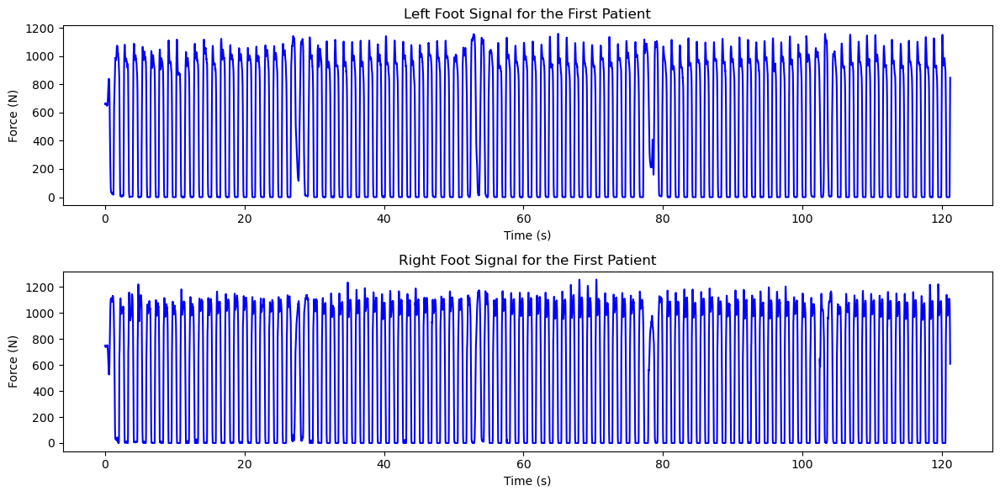

In [17]:
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called 'combined_df' that contains the data

# Filter the data for the first patient
patient_data = combined_df.iloc[0]

# Extract the left and right signal data
left_signal = patient_data['LeftTotalForce']
right_signal = patient_data['RightTotalForce']

# Create a time vector (assuming time is sampled at 100 Hz)
time = np.arange(len(left_signal)) / 100

# Create subplots for left and right signals side by side
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)  # 1 row, 2 columns, first plot
plt.plot(time, left_signal, label='Left Foot Signal', color='blue')
plt.xlabel('Time (s)')
plt.ylabel('Force (N)')
plt.title('Left Foot Signal for the First Patient')

plt.subplot(2, 1, 2)  # 1 row, 2 columns, second plot
plt.plot(time, right_signal, label='Right Foot Signal', color='blue')
plt.xlabel('Time (s)')
plt.ylabel('Force (N)')
plt.title('Right Foot Signal for the First Patient')

plt.tight_layout()  # Ensures proper spacing between subplots
plt.show()

In [18]:
plotOn = 1 # plotOn is set to 1 for plotting 

In [19]:
filelist = [file for file in os.listdir('D:\Machine Learning Project\All Data') if file.startswith('Ga') and file.endswith('.txt')]#Extractin Graph data from given dataset 

In [20]:
Graphdata  = np.full((len(filelist), 5), np.nan) # Graph data contain all the 5 graph derived features 

C:\Users\HP\AppData\Local\Temp\ipykernel_9128\3883969347.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


<Figure size 640x480 with 0 Axes>

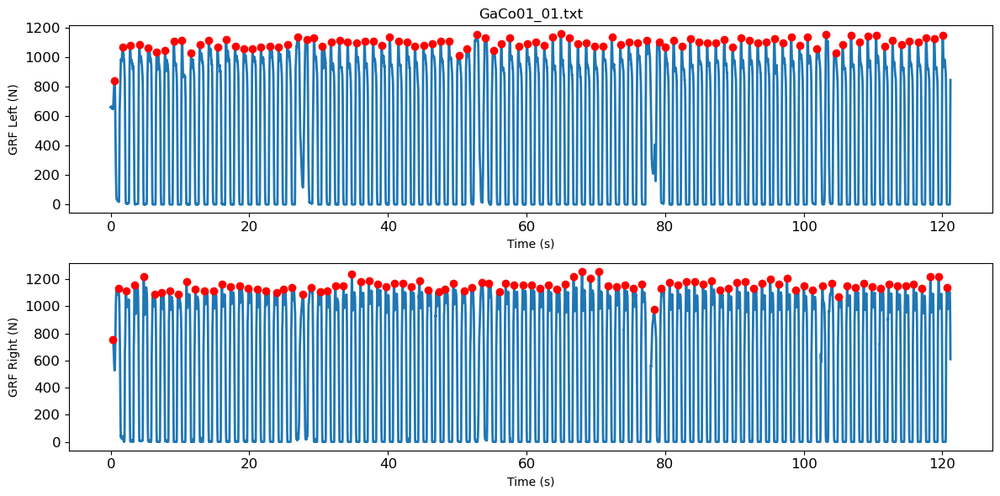

<Figure size 640x480 with 0 Axes>

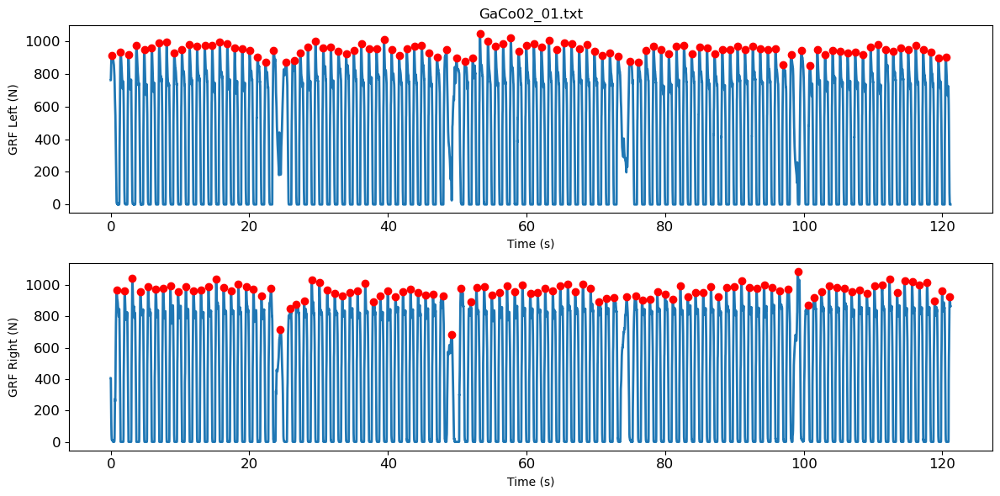

<Figure size 640x480 with 0 Axes>

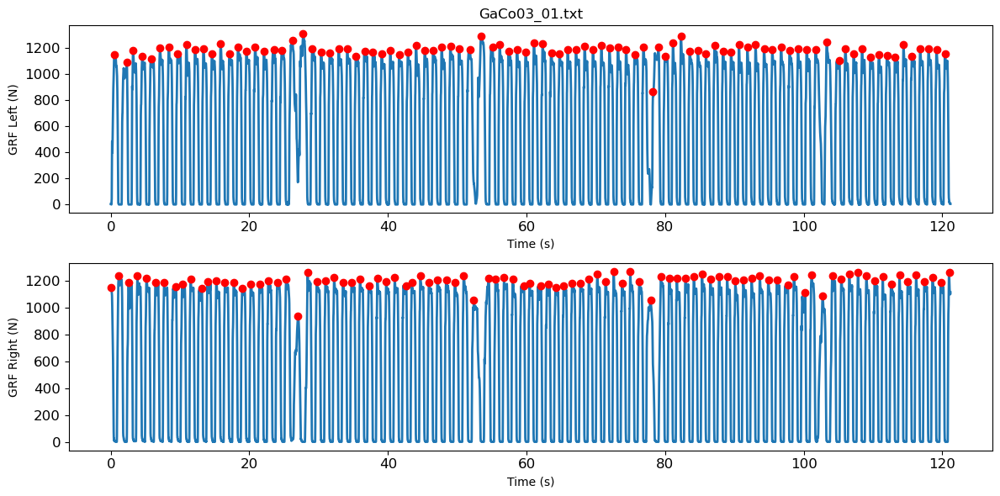

<Figure size 640x480 with 0 Axes>

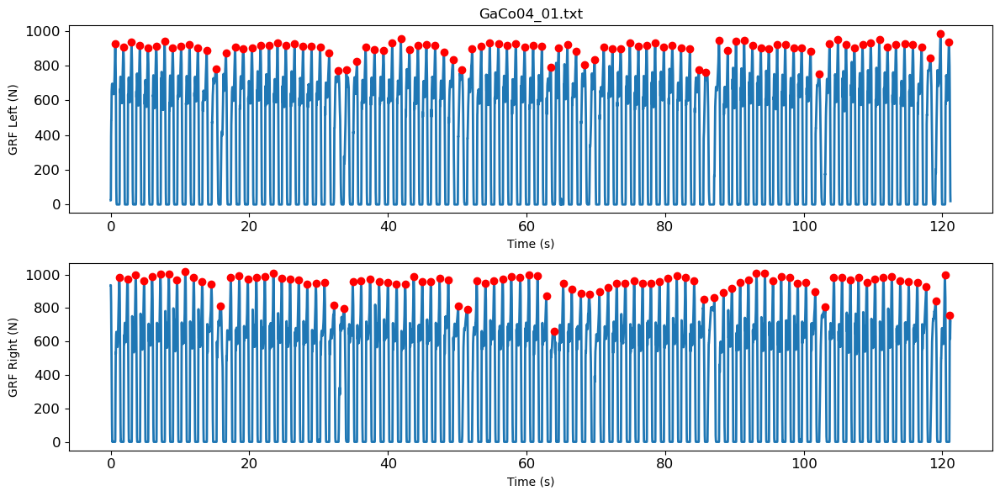

<Figure size 640x480 with 0 Axes>

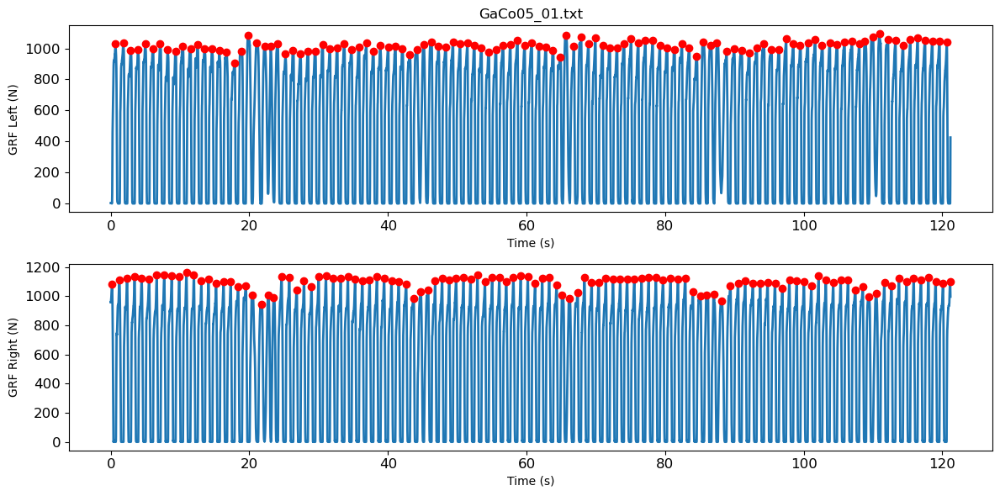

<Figure size 640x480 with 0 Axes>

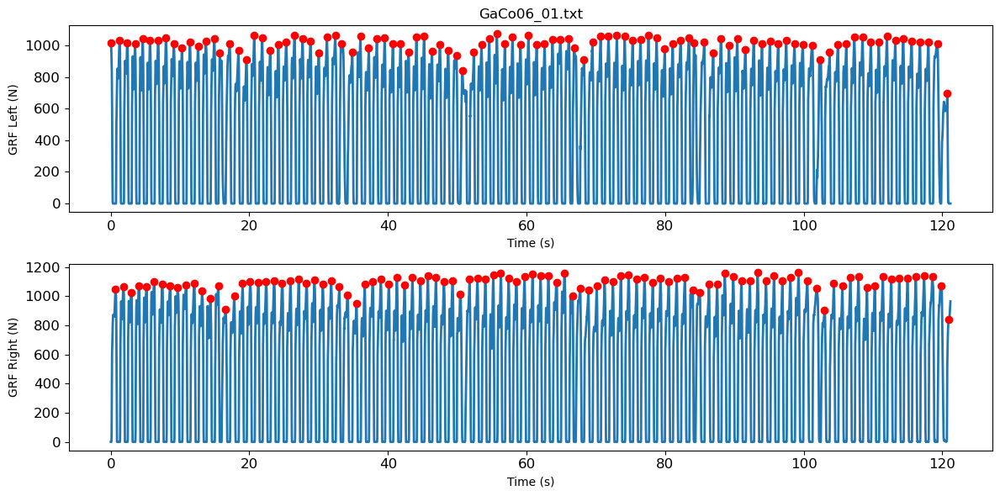

<Figure size 640x480 with 0 Axes>

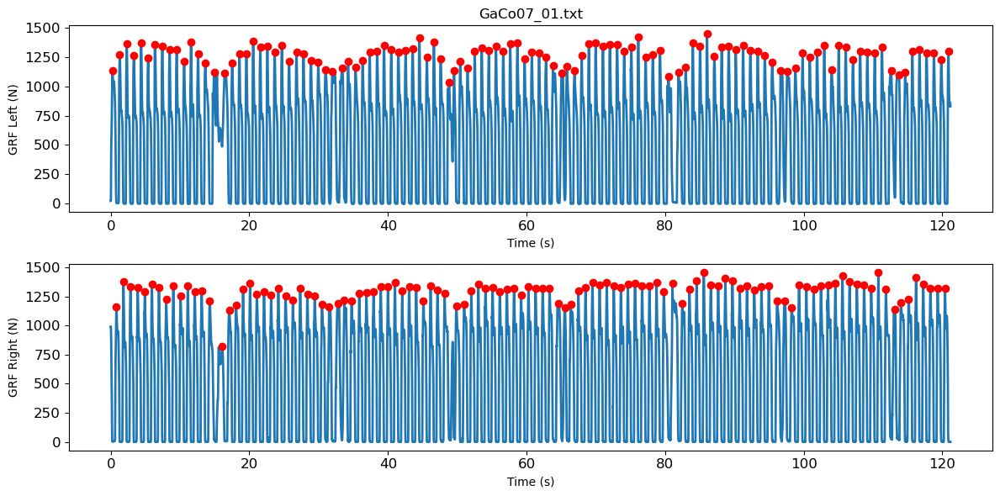

<Figure size 640x480 with 0 Axes>

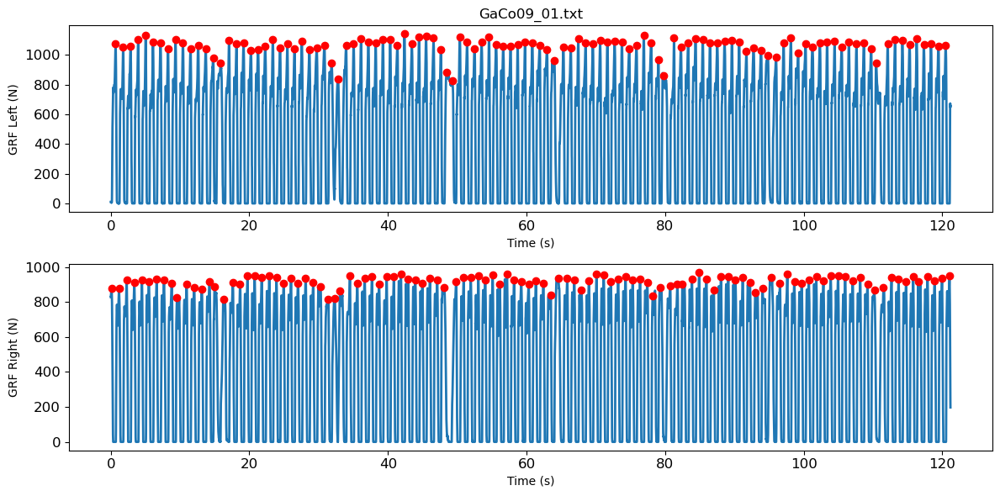

<Figure size 640x480 with 0 Axes>

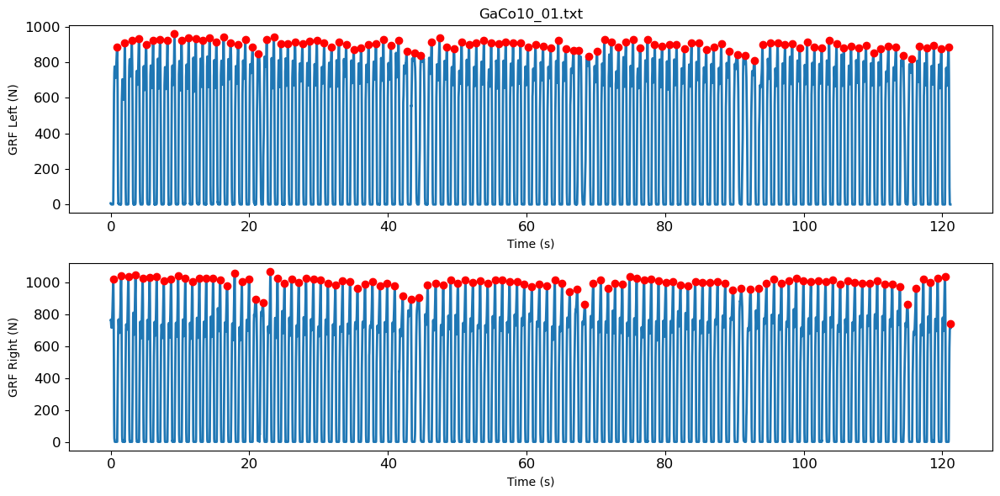

<Figure size 640x480 with 0 Axes>

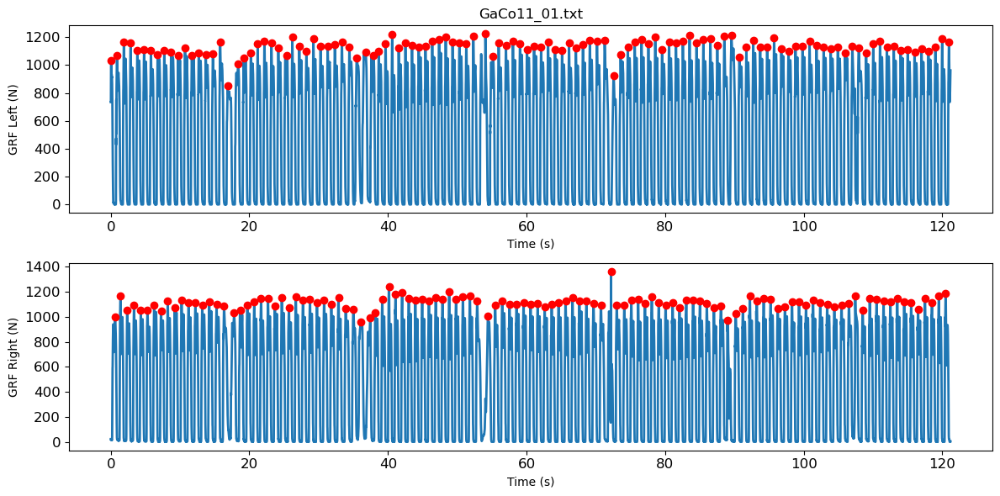

<Figure size 640x480 with 0 Axes>

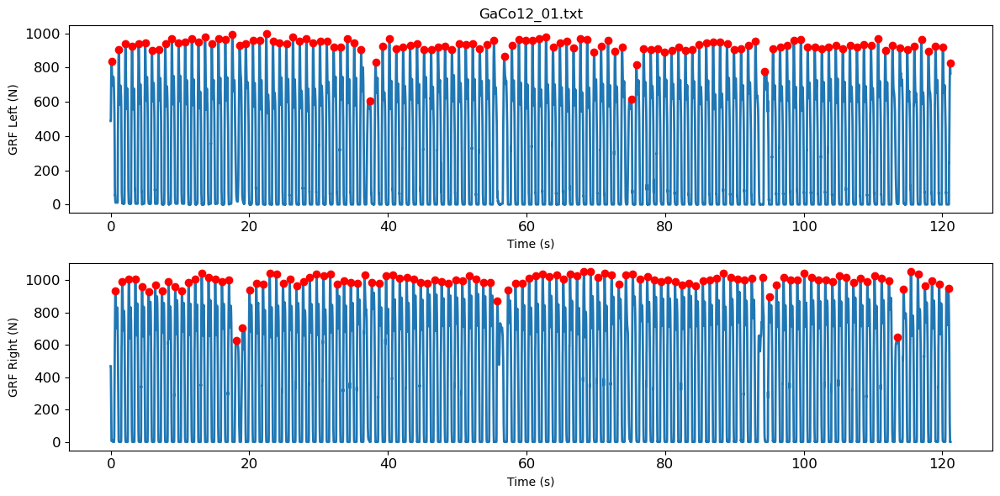

<Figure size 640x480 with 0 Axes>

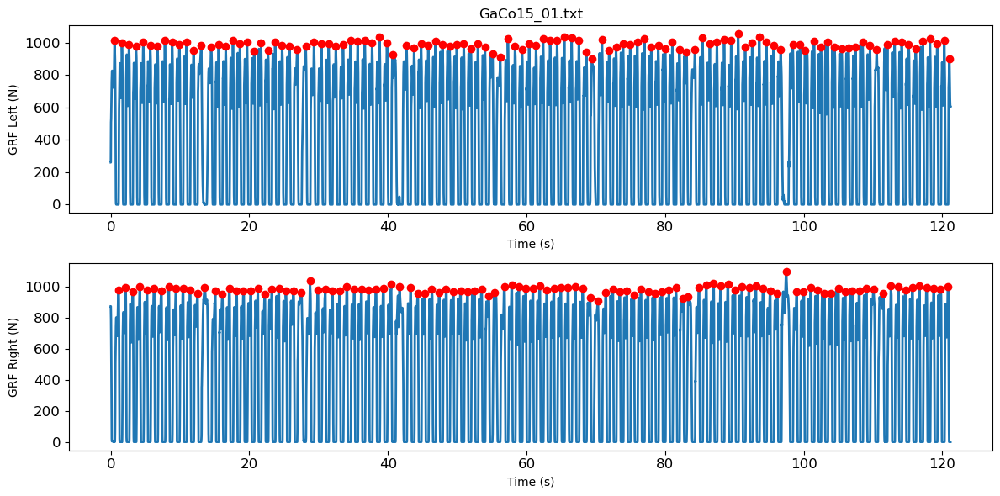

<Figure size 640x480 with 0 Axes>

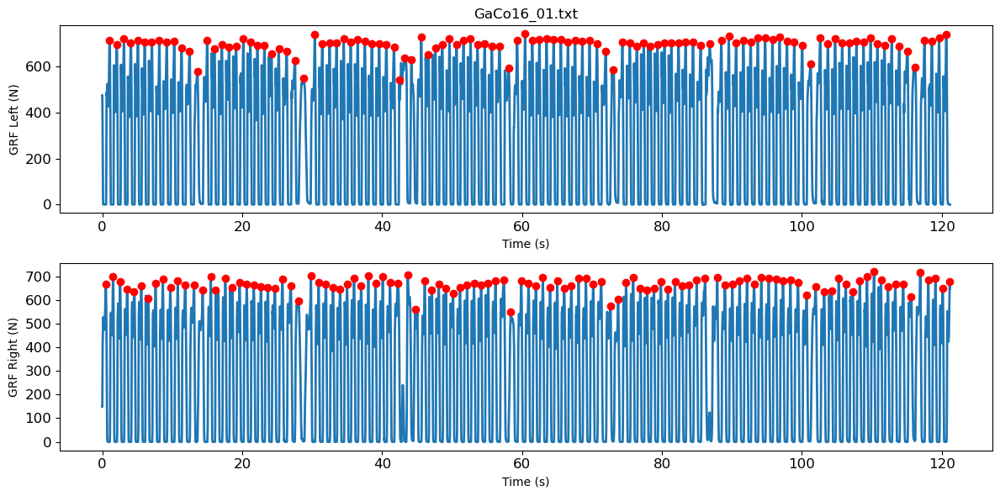

<Figure size 640x480 with 0 Axes>

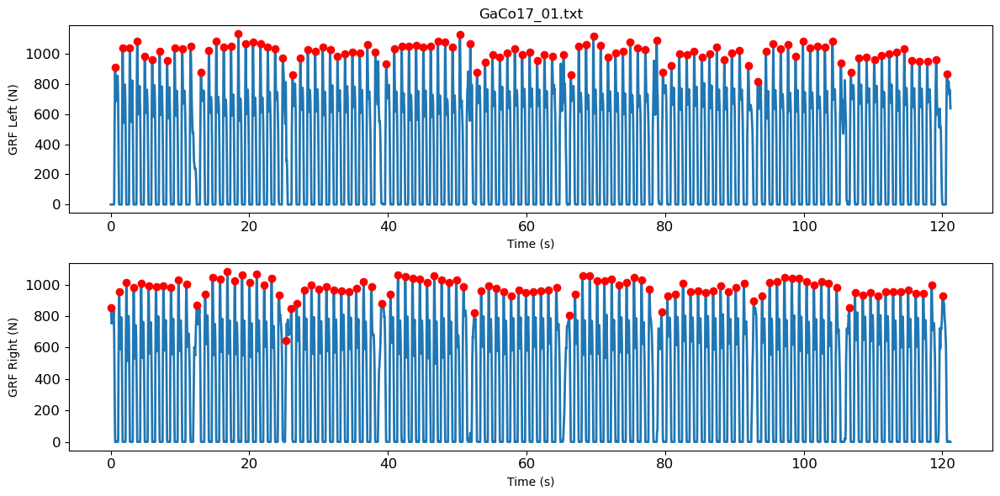

<Figure size 640x480 with 0 Axes>

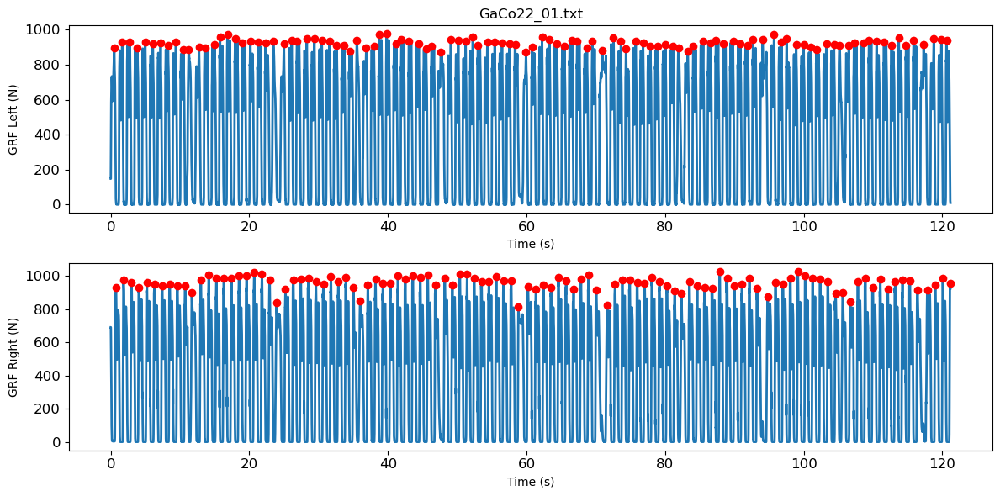

<Figure size 640x480 with 0 Axes>

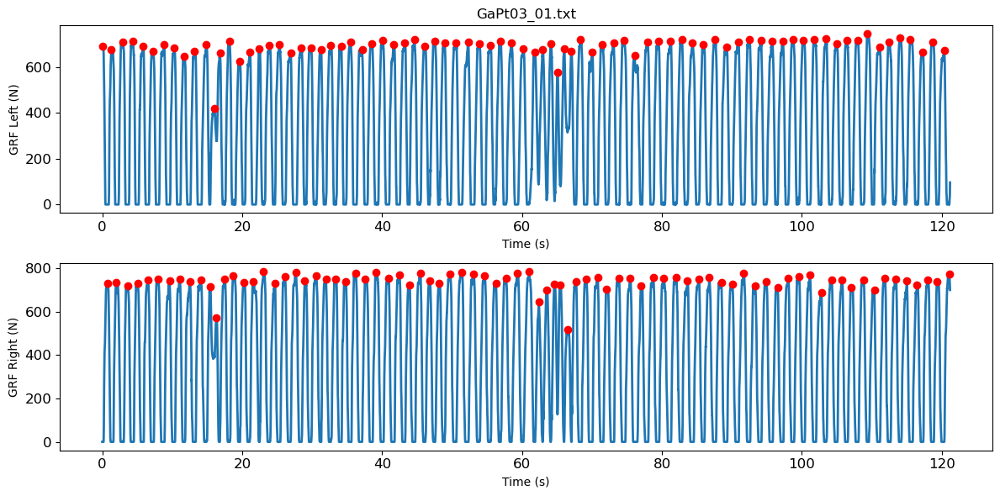

<Figure size 640x480 with 0 Axes>

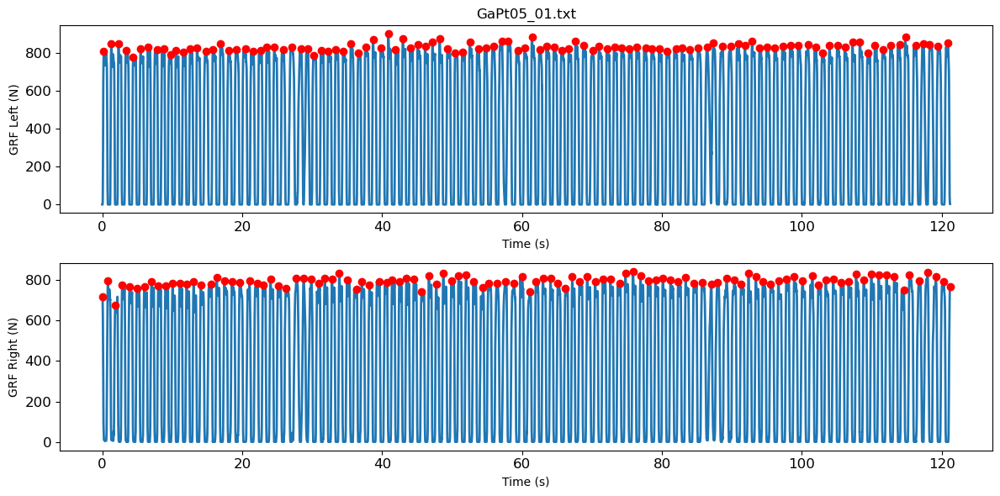

<Figure size 640x480 with 0 Axes>

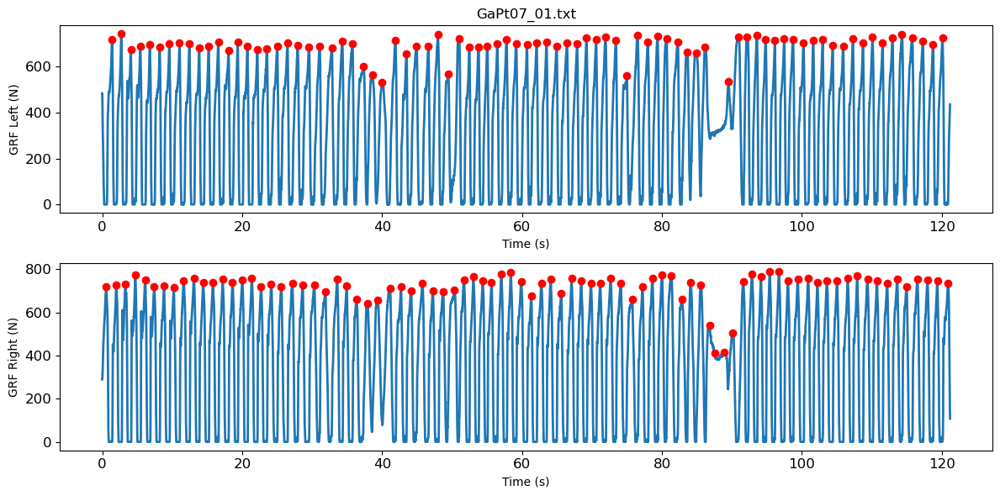

<Figure size 640x480 with 0 Axes>

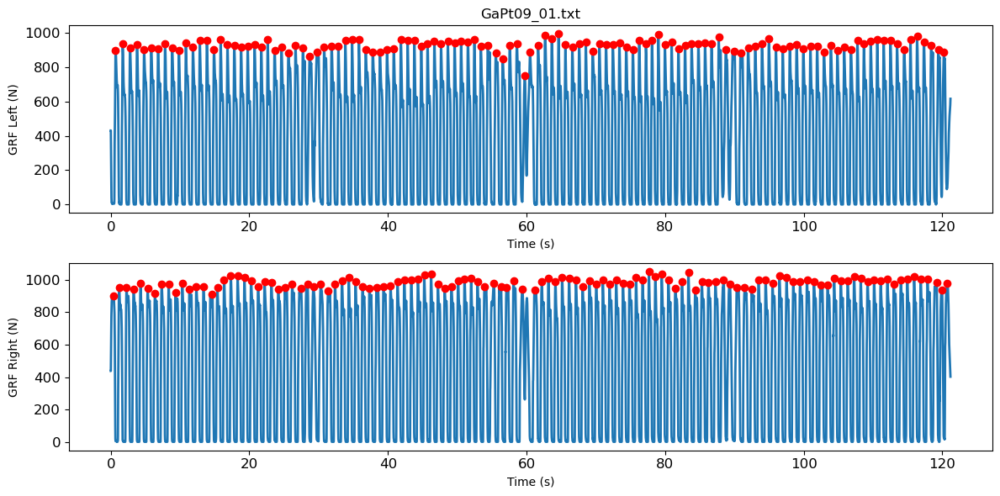

<Figure size 640x480 with 0 Axes>

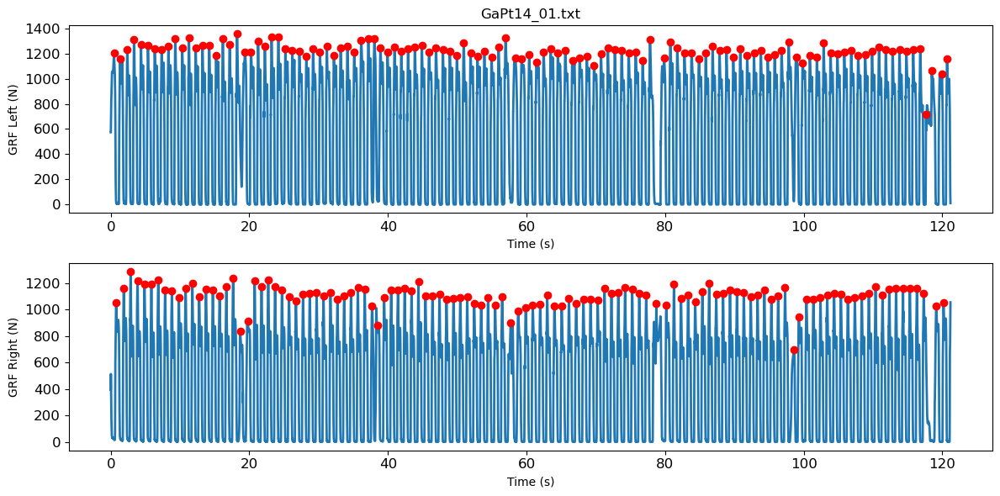

<Figure size 640x480 with 0 Axes>

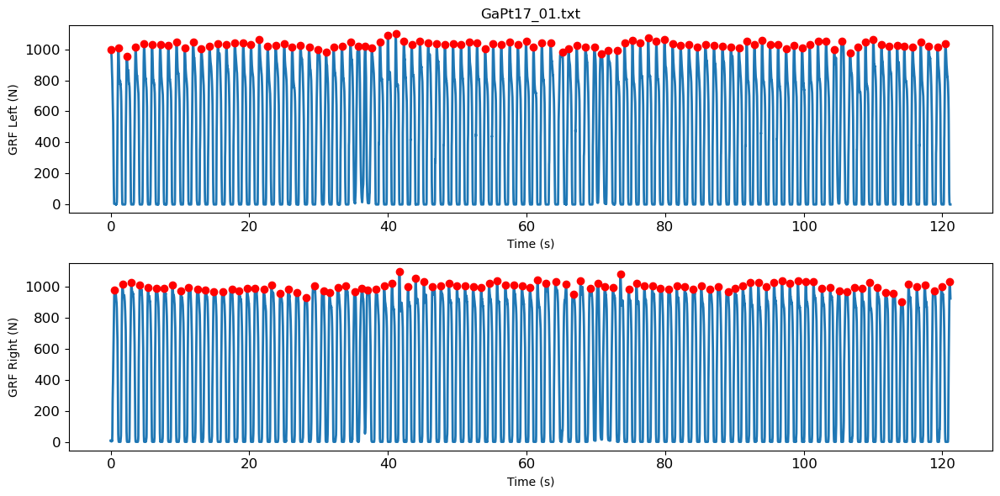

<Figure size 640x480 with 0 Axes>

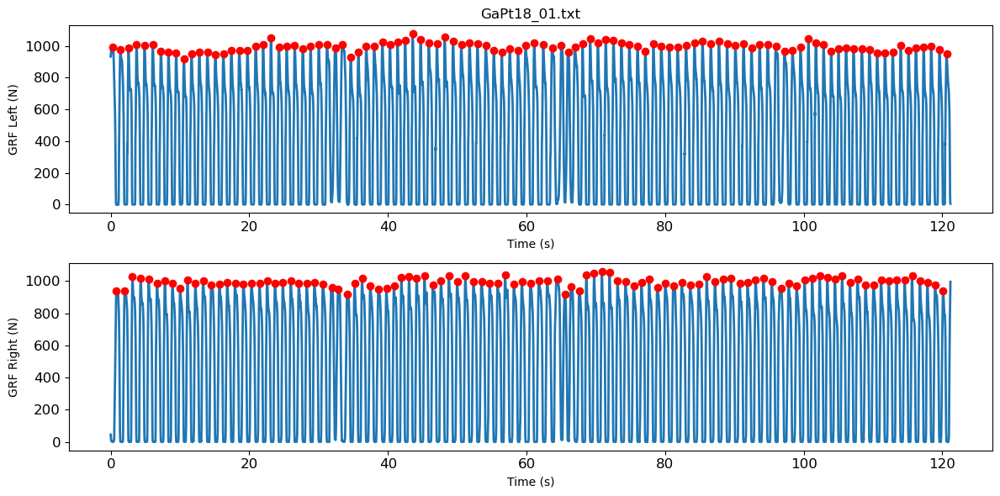

<Figure size 640x480 with 0 Axes>

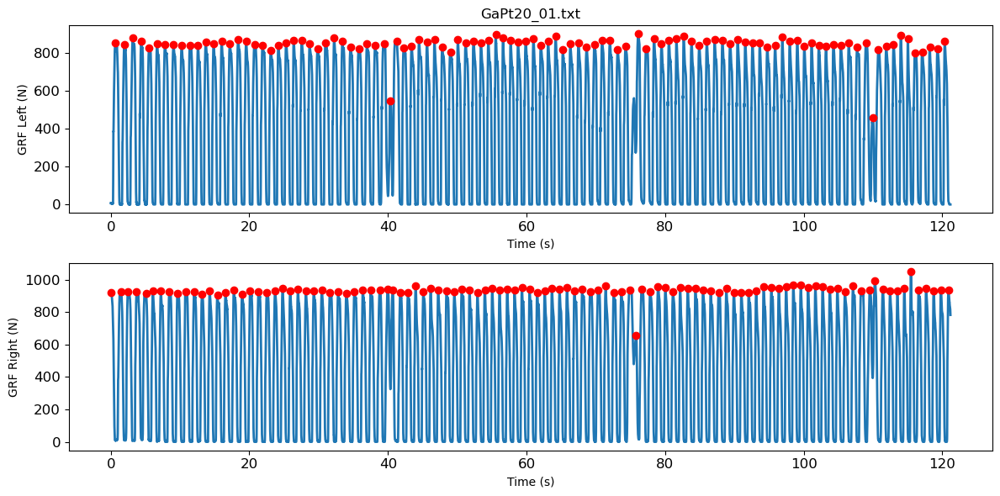

<Figure size 640x480 with 0 Axes>

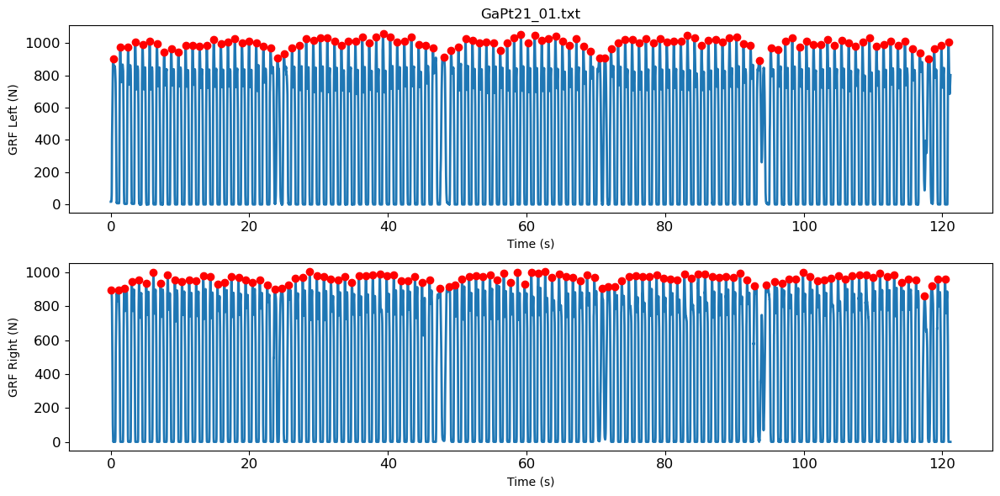

<Figure size 640x480 with 0 Axes>

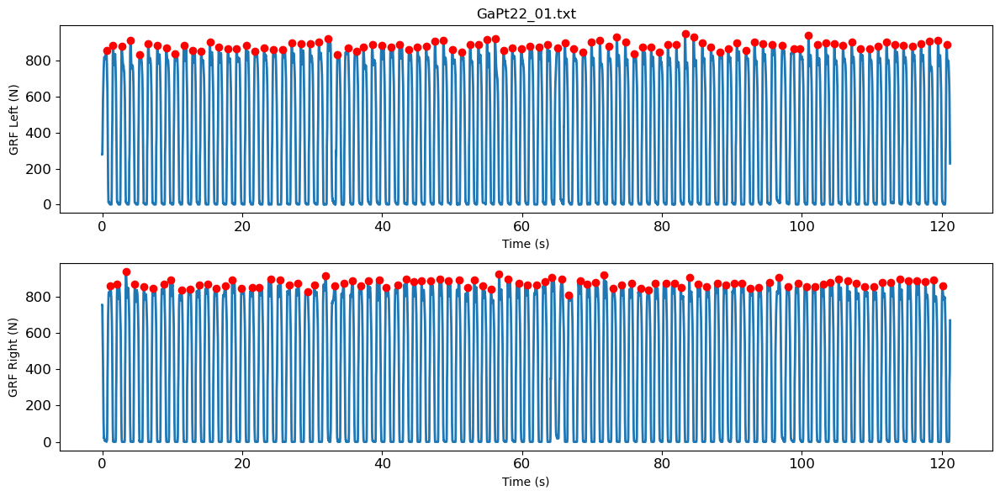

<Figure size 640x480 with 0 Axes>

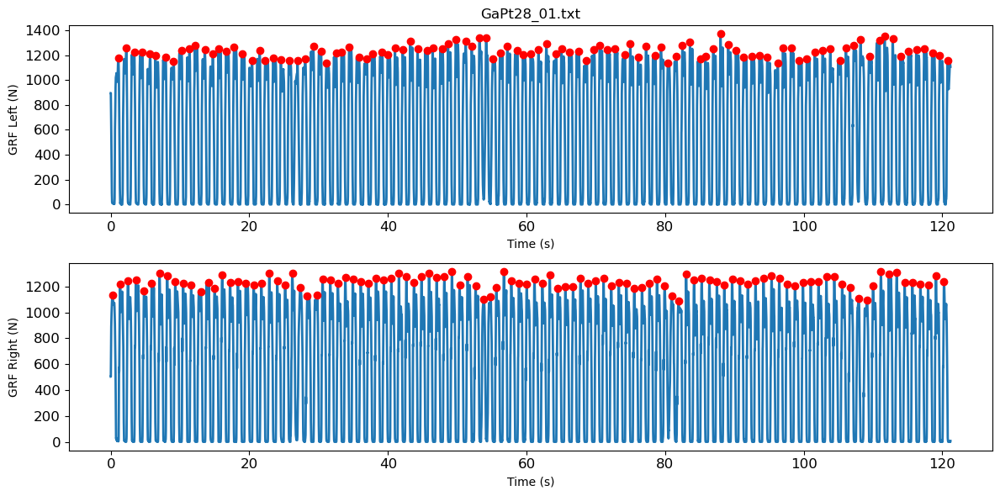

<Figure size 640x480 with 0 Axes>

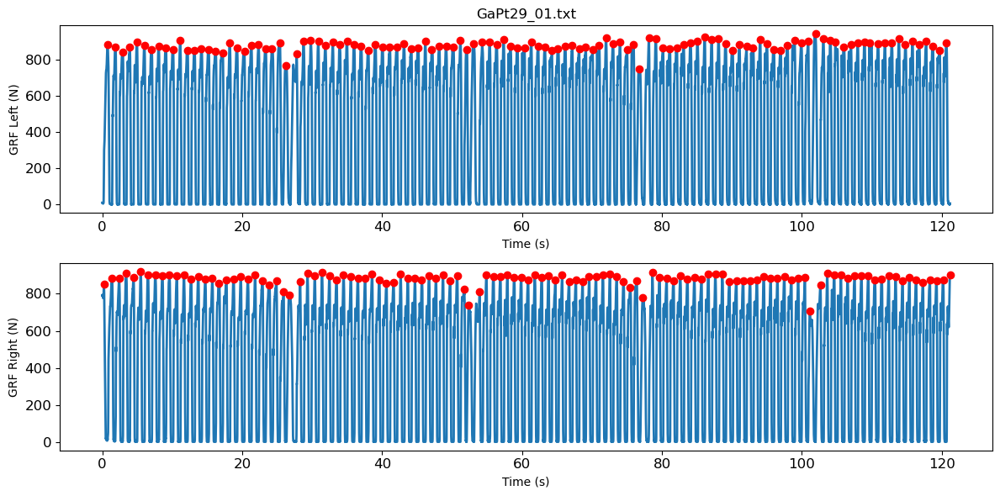

<Figure size 640x480 with 0 Axes>

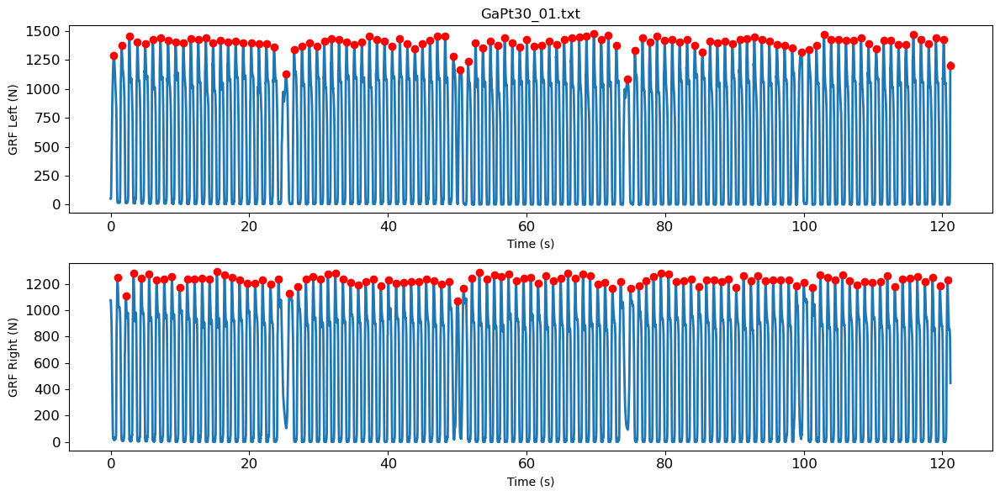

<Figure size 640x480 with 0 Axes>

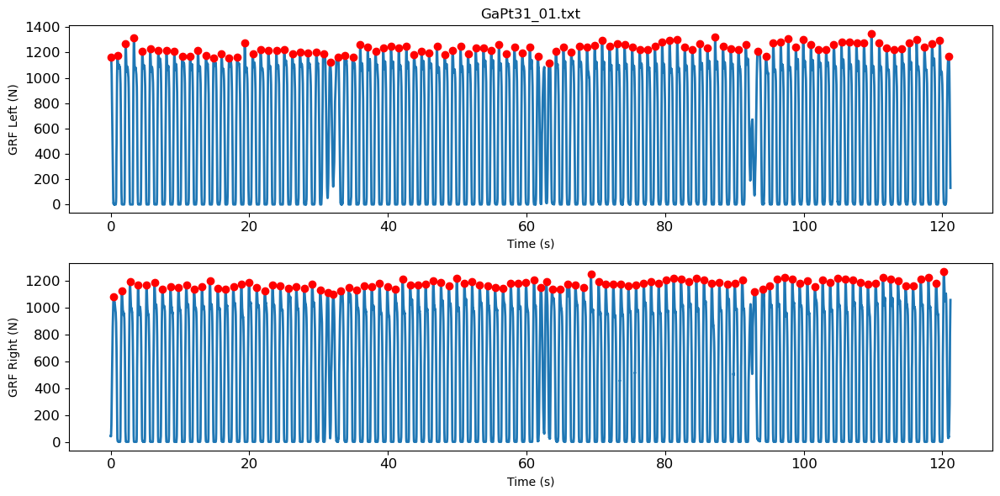

<Figure size 640x480 with 0 Axes>

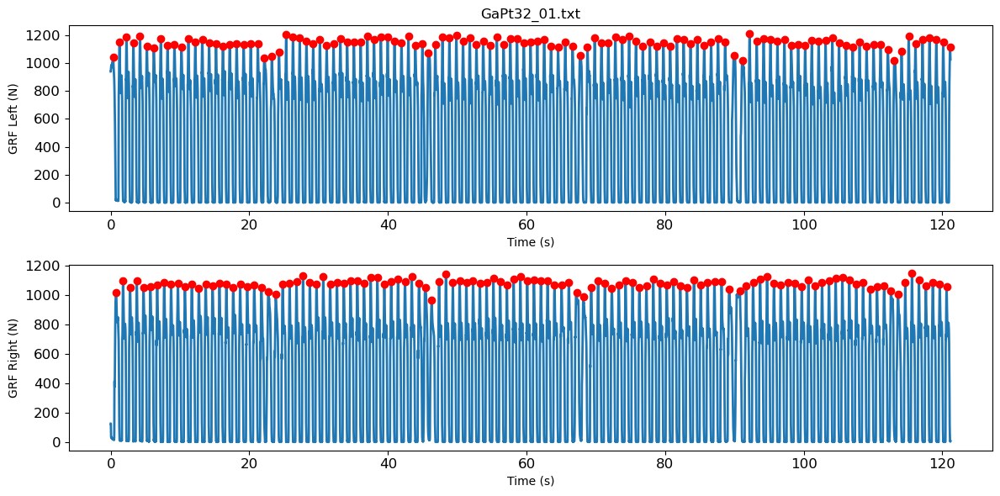

In [21]:
for iFile in range(len(filelist)):
    # Load sensor data
    sensordata = np.loadtxt(os.path.join('D:\Machine Learning Project\All Data', filelist[iFile]))
    time = sensordata[:, 0]
    totalForceLeft = sensordata[:, 17]
    totalForceRight = sensordata[:, 18]
    fs = 100  # GRF data were recorded at 100 Hz

    # Simple peak detection: check this works on all files, tweak if necessary
    pkAmpsL, _ = find_peaks(totalForceLeft, distance=0.7 * fs, height=0.5 * np.max(totalForceLeft))
    pkAmpsR, _ = find_peaks(totalForceRight, distance=0.7 * fs, height=0.5 * np.max(totalForceRight))

    # Calculate features (simple examples provided here)
    Graphdata[iFile, 0] = len(pkAmpsL)  # strides for left foot
    Graphdata[iFile, 1] = len(pkAmpsR)  # strides for right foot
    Graphdata[iFile, 2] = np.mean(np.diff(pkAmpsR)) / fs # mean stride time for right foot
    Graphdata[iFile, 3] = np.mean(np.diff(pkAmpsL)) / fs  # mean stride time left foot
    Graphdata[iFile, 4] = np.std(np.diff(pkAmpsL)) / (np.mean(np.diff(pkAmpsL)) / fs) # coefficient of variation (CV) stride time
   # X[iFile, 5] = np.mean(np.diff(pkAmpsR)) / fs  # mean stride time for right foot
    
    
    

    if plotOn:
        plt.figure()
        plt.figure(figsize=(12, 6))

        plt.subplot(2, 1, 1)
        plt.plot(time, totalForceLeft, linewidth=2)
        plt.plot(pkAmpsL / fs, totalForceLeft[pkAmpsL], 'ro')
        plt.xlabel('Time (s)')
        plt.ylabel('GRF Left (N)')
        plt.title(filelist[iFile])
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)

        plt.subplot(2, 1, 2)
        plt.plot(time, totalForceRight, linewidth=2)
        plt.plot(pkAmpsR / fs, totalForceRight[pkAmpsR], 'ro')
        plt.xlabel('Time (s)')
        plt.ylabel('GRF Right (N)')
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)

        plt.tight_layout()


plt.show()

In [23]:
combined_df

,LeftTotalForce,RightTotalForce,Study,Group,Subjnum,Gender,Age,Height (meters),Weight (kg),TUAG,Speed_01 (m/sec),Speed_10
ID,,,,,,,,,,,,
GaCo01,"[662.2, 662.2, 660.22, 664.07, 660.22, 660.0, ...","[748.0, 748.0, 748.0, 745.69, 748.44, 745.69, ...",Ga,CO,1,male,66,1.800,83.0,11.500,1.075,1.0270
GaCo02,"[763.18, 763.18, 777.7, 798.16, 816.09, 838.42...","[406.34, 406.34, 353.21, 303.05, 261.69, 224.7...",Ga,CO,2,male,74,1.740,70.0,9.148,1.040,1.0672
GaCo03,"[3.85, 3.85, 3.85, 3.85, 3.85, 3.85, 3.85, 3.8...","[1158.85, 1158.85, 1154.01, 1151.81, 1152.36, ...",Ga,CO,3,male,69,1.800,101.0,11.500,1.051,1.0270
GaCo04,"[23.98, 23.98, 84.04, 229.02, 329.12, 391.93, ...","[936.32, 936.32, 916.85, 899.25, 871.97, 832.7...",Ga,CO,4,male,86,1.660,65.0,9.570,1.175,1.2502
GaCo05,"[2.75, 2.75, 4.18, 4.18, 4.18, 4.18, 4.18, 4.1...","[958.43, 958.43, 957.11, 962.28, 965.25, 971.7...",Ga,CO,5,female,75,1.500,88.0,12.292,0.920,1.0910
GaCo06,"[994.18, 994.18, 1000.89, 1006.72, 1014.53, 10...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",Ga,CO,6,male,82,1.680,82.0,9.700,1.121,1.2502
GaCo07,"[23.21, 23.21, 39.49, 108.57, 302.72, 346.83, ...","[990.77, 990.77, 983.07, 964.04, 946.11, 923.2...",Ga,CO,7,male,79,1.680,95.0,11.440,1.282,1.1752
GaCo09,"[10.23, 10.23, 10.23, 10.23, 10.23, 10.23, 10....","[827.86, 827.86, 831.93, 839.41, 841.39, 847.6...",Ga,CO,9,female,78,1.630,64.0,11.292,1.249,1.1194
GaCo10,"[7.26, 7.26, 3.85, 3.85, 3.85, 3.85, 3.85, 3.8...","[763.51, 763.51, 763.07, 758.78, 751.08, 745.2...",Ga,CO,10,male,69,1.720,70.0,10.120,1.164,1.2660


## Remaining 5 Feature Extraction 

In [24]:
sampling_rate = 100


# Define a function to calculate the step count
def calculate_step_count(left_signal, right_signal):
    left_step_count = len([i for i in range(1, len(left_signal) - 1) if left_signal[i - 1] < left_signal[i] > left_signal[i + 1]])
    right_step_count = len([i for i in range(1, len(right_signal) - 1) if right_signal[i - 1] < right_signal[i] > right_signal[i + 1]])
    total_step_count = left_step_count + right_step_count
    return total_step_count

# Define a function to calculate the average stride time
def calculate_average_stride_time(left_signal, right_signal, sampling_rate):
    time = np.arange(len(left_signal)) / sampling_rate  # Time vector (as previously defined)
    left_stride_times = [time[i] - time[i - 1] for i in range(1, len(left_signal)) if left_signal[i] > 0]
    right_stride_times = [time[i] - time[i - 1] for i in range(1, len(right_signal)) if right_signal[i] > 0]
    average_left_stride_time = np.mean(left_stride_times)
    average_right_stride_time = np.mean(right_stride_times)
    average_stride_time = (average_left_stride_time + average_right_stride_time) / 2
    return average_stride_time

# Define a function to calculate the variation in stride time
def calculate_variation_in_stride_time(left_signal, right_signal, sampling_rate):
    time = np.arange(len(left_signal)) / sampling_rate  # Time vector (as previously defined)
    left_stride_times = [time[i] - time[i - 1] for i in range(1, len(left_signal)) if left_signal[i] > 0]
    right_stride_times = [time[i] - time[i - 1] for i in range(1, len(right_signal)) if right_signal[i] > 0]
    std_left_stride_time = np.std(left_stride_times)
    std_right_stride_time = np.std(right_stride_times)
    variation_in_stride_time = (std_left_stride_time + std_right_stride_time) / (2 * np.mean(left_stride_times))
    return variation_in_stride_time

# Define a function to calculate stride time asymmetry
def calculate_stride_time_asymmetry(left_signal, right_signal, sampling_rate):
    time = np.arange(len(left_signal)) / sampling_rate  # Time vector (as previously defined)
    left_stride_times = [time[i] - time[i - 1] for i in range(1, len(left_signal)) if left_signal[i] > 0]
    right_stride_times = [time[i] - time[i - 1] for i in range(1, len(right_signal)) if right_signal[i] > 0]
    average_left_stride_time = np.mean(left_stride_times)
    average_right_stride_time = np.mean(right_stride_times)
    stride_time_asymmetry = min(average_left_stride_time, average_right_stride_time) / max(average_left_stride_time, average_right_stride_time)
    return stride_time_asymmetry

# Define a function to calculate gait speed
def calculate_gait_speed(left_signal, sampling_rate):
    time = np.arange(len(left_signal)) / sampling_rate  # Time vector (as previously defined)
    distance_traveled = np.trapz(left_signal)  # Example: Using the area under the left signal as distance
    gait_speed = distance_traveled / (time[-1] - time[0])  # Calculate speed based on time duration
    return gait_speed

# Apply the functions to calculate and add the columns to the DataFrame
combined_df['StepCount'] = combined_df.apply(lambda row: calculate_step_count(row['LeftTotalForce'], row['RightTotalForce']), axis=1)
combined_df['AverageStrideTime'] = combined_df.apply(lambda row: calculate_average_stride_time(row['LeftTotalForce'], row['RightTotalForce'], sampling_rate), axis=1)
combined_df['VariationInStrideTime'] = combined_df.apply(lambda row: calculate_variation_in_stride_time(row['LeftTotalForce'], row['RightTotalForce'], sampling_rate), axis=1)
combined_df['StrideTimeAsymmetry'] = combined_df.apply(lambda row: calculate_stride_time_asymmetry(row['LeftTotalForce'], row['RightTotalForce'], sampling_rate), axis=1)
combined_df['GaitSpeed'] = combined_df.apply(lambda row: calculate_gait_speed(row['LeftTotalForce'], sampling_rate), axis=1)

# Create a new feature as the ratio of BMI to Age
combined_df['BMI_Age_Ratio'] =  combined_df['Weight (kg)'] / ((combined_df['Height (meters)'] / 100) ** 2) / combined_df['Age']


feature_set = combined_df[['Age','Height (meters)','Weight (kg)','Speed_01 (m/sec)', 'TUAG','StepCount', 'AverageStrideTime', 'VariationInStrideTime', 'StrideTimeAsymmetry', 'GaitSpeed', 'BMI_Age_Ratio','Group']]

In [25]:
feature_set # Contains all features new Features 

,Age,Height (meters),Weight (kg),Speed_01 (m/sec),TUAG,StepCount,AverageStrideTime,VariationInStrideTime,StrideTimeAsymmetry,GaitSpeed,BMI_Age_Ratio,Group
ID,,,,,,,,,,,,
GaCo01,66,1.800,83.0,1.075,11.500,1187,0.01,4.917366e-13,1.0,52063.590031,3881.406659,CO
GaCo02,74,1.740,70.0,1.040,9.148,1100,0.01,5.004560e-13,1.0,44122.405182,3124.408594,CO
GaCo03,69,1.800,101.0,1.051,11.500,1235,0.01,4.992190e-13,1.0,60068.008995,4517.802827,CO
GaCo04,86,1.660,65.0,1.175,9.570,887,0.01,5.004318e-13,1.0,39836.234486,2742.828979,CO
GaCo05,75,1.500,88.0,0.920,12.292,1237,0.01,5.020485e-13,1.0,51350.666942,5214.814815,CO
GaCo06,82,1.680,82.0,1.121,9.700,680,0.01,5.049169e-13,1.0,46591.762667,3543.083900,CO
GaCo07,79,1.680,95.0,1.282,11.440,878,0.01,5.004584e-13,1.0,51502.403037,4260.670513,CO
GaCo09,78,1.630,64.0,1.249,11.292,809,0.01,5.004395e-13,1.0,46101.544190,3088.233733,CO
GaCo10,69,1.720,70.0,1.164,10.120,792,0.01,4.981833e-13,1.0,40635.294438,3429.194002,CO


In [26]:
Graphdata

array([[ 98.        ,  99.        ,   1.22857143,   1.23226804,
          7.851923  ],
       [108.        , 108.        ,   1.12373832,   1.12514019,
         10.35370255],
       [ 97.        ,  97.        ,   1.25979167,   1.24875   ,
         12.2221908 ],
       [ 97.        ,  97.        ,   1.24864583,   1.253125  ,
          8.71534503],
       [115.        , 116.        ,   1.05182609,   1.0522807 ,
          7.51664038],
       [104.        , 104.        ,   1.16737864,   1.17165049,
         10.71053921],
       [116.        , 114.        ,   1.05823009,   1.04895652,
          9.75889379],
       [114.        , 114.        ,   1.07026549,   1.0600885 ,
          9.22168428],
       [113.        , 114.        ,   1.06876106,   1.07125   ,
          8.03513931],
       [120.        , 119.        ,   1.01567797,   1.01588235,
         10.55762338],
       [121.        , 120.        ,   1.01016807,   1.0085    ,
          8.12509115],
       [115.        , 114.        ,   1.059

In [27]:
Graphdata=pd.DataFrame(Graphdata) # converting Graphdata array to DataFrame 

In [28]:
Graphdata # contains all old Features 

,0,1,2,3,4
0,98.0,99.0,1.228571,1.232268,7.851923
1,108.0,108.0,1.123738,1.125140,10.353703
2,97.0,97.0,1.259792,1.248750,12.222191
3,97.0,97.0,1.248646,1.253125,8.715345
4,115.0,116.0,1.051826,1.052281,7.516640
5,104.0,104.0,1.167379,1.171650,10.710539
6,116.0,114.0,1.058230,1.048957,9.758894
7,114.0,114.0,1.070265,1.060088,9.221684
8,113.0,114.0,1.068761,1.071250,8.035139
9,120.0,119.0,1.015678,1.015882,10.557623


In [29]:
Graphdata.columns=['StrideLeftFoot','StrideRightFoot','MeanLeftStrideTime','MeanRightStrideTime','CV Stride Time'] # Naming all Feature Columns 

In [30]:
Graphdata

,StrideLeftFoot,StrideRightFoot,MeanLeftStrideTime,MeanRightStrideTime,CV Stride Time
0,98.0,99.0,1.228571,1.232268,7.851923
1,108.0,108.0,1.123738,1.125140,10.353703
2,97.0,97.0,1.259792,1.248750,12.222191
3,97.0,97.0,1.248646,1.253125,8.715345
4,115.0,116.0,1.051826,1.052281,7.516640
5,104.0,104.0,1.167379,1.171650,10.710539
6,116.0,114.0,1.058230,1.048957,9.758894
7,114.0,114.0,1.070265,1.060088,9.221684
8,113.0,114.0,1.068761,1.071250,8.035139
9,120.0,119.0,1.015678,1.015882,10.557623


In [31]:
Graphdata_reset = Graphdata.reset_index(drop=True)

In [32]:
Graphdata_reset

,StrideLeftFoot,StrideRightFoot,MeanLeftStrideTime,MeanRightStrideTime,CV Stride Time
0,98.0,99.0,1.228571,1.232268,7.851923
1,108.0,108.0,1.123738,1.125140,10.353703
2,97.0,97.0,1.259792,1.248750,12.222191
3,97.0,97.0,1.248646,1.253125,8.715345
4,115.0,116.0,1.051826,1.052281,7.516640
5,104.0,104.0,1.167379,1.171650,10.710539
6,116.0,114.0,1.058230,1.048957,9.758894
7,114.0,114.0,1.070265,1.060088,9.221684
8,113.0,114.0,1.068761,1.071250,8.035139
9,120.0,119.0,1.015678,1.015882,10.557623


In [33]:
feature_set

,Age,Height (meters),Weight (kg),Speed_01 (m/sec),TUAG,StepCount,AverageStrideTime,VariationInStrideTime,StrideTimeAsymmetry,GaitSpeed,BMI_Age_Ratio,Group
ID,,,,,,,,,,,,
GaCo01,66,1.800,83.0,1.075,11.500,1187,0.01,4.917366e-13,1.0,52063.590031,3881.406659,CO
GaCo02,74,1.740,70.0,1.040,9.148,1100,0.01,5.004560e-13,1.0,44122.405182,3124.408594,CO
GaCo03,69,1.800,101.0,1.051,11.500,1235,0.01,4.992190e-13,1.0,60068.008995,4517.802827,CO
GaCo04,86,1.660,65.0,1.175,9.570,887,0.01,5.004318e-13,1.0,39836.234486,2742.828979,CO
GaCo05,75,1.500,88.0,0.920,12.292,1237,0.01,5.020485e-13,1.0,51350.666942,5214.814815,CO
GaCo06,82,1.680,82.0,1.121,9.700,680,0.01,5.049169e-13,1.0,46591.762667,3543.083900,CO
GaCo07,79,1.680,95.0,1.282,11.440,878,0.01,5.004584e-13,1.0,51502.403037,4260.670513,CO
GaCo09,78,1.630,64.0,1.249,11.292,809,0.01,5.004395e-13,1.0,46101.544190,3088.233733,CO
GaCo10,69,1.720,70.0,1.164,10.120,792,0.01,4.981833e-13,1.0,40635.294438,3429.194002,CO


In [34]:
Graphdata_reset = Graphdata.reset_index(drop=True)
feature_set_reset = feature_set.reset_index(drop=True)

In [35]:
combined_feature=pd.concat([feature_set_reset, Graphdata_reset], axis=1)

In [36]:
combined_feature # Contains all new as well as old features 

,Age,Height (meters),Weight (kg),Speed_01 (m/sec),TUAG,StepCount,AverageStrideTime,VariationInStrideTime,StrideTimeAsymmetry,GaitSpeed,BMI_Age_Ratio,Group,StrideLeftFoot,StrideRightFoot,MeanLeftStrideTime,MeanRightStrideTime,CV Stride Time
0,66,1.800,83.0,1.075,11.500,1187,0.01,4.917366e-13,1.0,52063.590031,3881.406659,CO,98.0,99.0,1.228571,1.232268,7.851923
1,74,1.740,70.0,1.040,9.148,1100,0.01,5.004560e-13,1.0,44122.405182,3124.408594,CO,108.0,108.0,1.123738,1.125140,10.353703
2,69,1.800,101.0,1.051,11.500,1235,0.01,4.992190e-13,1.0,60068.008995,4517.802827,CO,97.0,97.0,1.259792,1.248750,12.222191
3,86,1.660,65.0,1.175,9.570,887,0.01,5.004318e-13,1.0,39836.234486,2742.828979,CO,97.0,97.0,1.248646,1.253125,8.715345
4,75,1.500,88.0,0.920,12.292,1237,0.01,5.020485e-13,1.0,51350.666942,5214.814815,CO,115.0,116.0,1.051826,1.052281,7.516640
5,82,1.680,82.0,1.121,9.700,680,0.01,5.049169e-13,1.0,46591.762667,3543.083900,CO,104.0,104.0,1.167379,1.171650,10.710539
6,79,1.680,95.0,1.282,11.440,878,0.01,5.004584e-13,1.0,51502.403037,4260.670513,CO,116.0,114.0,1.058230,1.048957,9.758894
7,78,1.630,64.0,1.249,11.292,809,0.01,5.004395e-13,1.0,46101.544190,3088.233733,CO,114.0,114.0,1.070265,1.060088,9.221684
8,69,1.720,70.0,1.164,10.120,792,0.01,4.981833e-13,1.0,40635.294438,3429.194002,CO,113.0,114.0,1.068761,1.071250,8.035139
9,70,1.750,80.0,1.515,7.160,853,0.01,5.006569e-13,1.0,50033.873989,3731.778426,CO,120.0,119.0,1.015678,1.015882,10.557623


In [37]:
combined_feature['Group']=combined_feature['Group'].map({'CO':0,'PD':1}) # converting to binary 0 and 1

In [38]:
column_to_move = 'Group'

# Reorder the columns
new_order = [col for col in combined_feature.columns if col != column_to_move] + [column_to_move]
combined_feature = combined_feature[new_order]

In [39]:
combined_feature

,Age,Height (meters),Weight (kg),Speed_01 (m/sec),TUAG,StepCount,AverageStrideTime,VariationInStrideTime,StrideTimeAsymmetry,GaitSpeed,BMI_Age_Ratio,StrideLeftFoot,StrideRightFoot,MeanLeftStrideTime,MeanRightStrideTime,CV Stride Time,Group
0,66,1.800,83.0,1.075,11.500,1187,0.01,4.917366e-13,1.0,52063.590031,3881.406659,98.0,99.0,1.228571,1.232268,7.851923,0
1,74,1.740,70.0,1.040,9.148,1100,0.01,5.004560e-13,1.0,44122.405182,3124.408594,108.0,108.0,1.123738,1.125140,10.353703,0
2,69,1.800,101.0,1.051,11.500,1235,0.01,4.992190e-13,1.0,60068.008995,4517.802827,97.0,97.0,1.259792,1.248750,12.222191,0
3,86,1.660,65.0,1.175,9.570,887,0.01,5.004318e-13,1.0,39836.234486,2742.828979,97.0,97.0,1.248646,1.253125,8.715345,0
4,75,1.500,88.0,0.920,12.292,1237,0.01,5.020485e-13,1.0,51350.666942,5214.814815,115.0,116.0,1.051826,1.052281,7.516640,0
5,82,1.680,82.0,1.121,9.700,680,0.01,5.049169e-13,1.0,46591.762667,3543.083900,104.0,104.0,1.167379,1.171650,10.710539,0
6,79,1.680,95.0,1.282,11.440,878,0.01,5.004584e-13,1.0,51502.403037,4260.670513,116.0,114.0,1.058230,1.048957,9.758894,0
7,78,1.630,64.0,1.249,11.292,809,0.01,5.004395e-13,1.0,46101.544190,3088.233733,114.0,114.0,1.070265,1.060088,9.221684,0
8,69,1.720,70.0,1.164,10.120,792,0.01,4.981833e-13,1.0,40635.294438,3429.194002,113.0,114.0,1.068761,1.071250,8.035139,0
9,70,1.750,80.0,1.515,7.160,853,0.01,5.006569e-13,1.0,50033.873989,3731.778426,120.0,119.0,1.015678,1.015882,10.557623,0


# Feature Rescaling 

In [40]:
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler
scaler = MinMaxScaler()

# Define the feature columns you want to normalize
feature_columns = ['Speed_01 (m/sec)', 'TUAG','StepCount', 'AverageStrideTime', 'VariationInStrideTime', 'StrideTimeAsymmetry', 'GaitSpeed', 'BMI_Age_Ratio','StrideLeftFoot','StrideRightFoot', 'MeanLeftStrideTime','MeanRightStrideTime','CV Stride Time']

# Calculate the minimum and maximum values across the entire dataset for the selected features
min_max_values = combined_feature[feature_columns].agg(['min', 'max'])

# Apply the min-max normalization to the selected features
normalized_features = scaler.fit_transform(combined_feature[feature_columns])

# Create a new DataFrame with the normalized features
normalized_df = pd.DataFrame(normalized_features, columns=feature_columns)

In [41]:
normalized_df

,Speed_01 (m/sec),TUAG,StepCount,AverageStrideTime,VariationInStrideTime,StrideTimeAsymmetry,GaitSpeed,BMI_Age_Ratio,StrideLeftFoot,StrideRightFoot,MeanLeftStrideTime,MeanRightStrideTime,CV Stride Time
0,0.460116,0.388193,0.562028,6.938894e-18,0.263707,0.9375,0.693654,0.484110,0.400,0.425,0.477694,0.491736,0.208787
1,0.419653,0.177818,0.468177,6.938894e-18,0.569281,0.9375,0.439515,0.191231,0.650,0.650,0.264010,0.276135,0.360144
2,0.432370,0.388193,0.613808,3.469447e-18,0.525928,0.3750,0.949816,0.730329,0.375,0.375,0.541331,0.524907,0.473188
3,0.575723,0.215564,0.238403,1.040834e-17,0.568433,0.9375,0.302347,0.043599,0.375,0.375,0.518612,0.533712,0.261024
4,0.280925,0.459034,0.615965,8.673617e-18,0.625090,0.7500,0.670839,1.000000,0.825,0.850,0.117430,0.129501,0.188502
5,0.513295,0.227191,0.015102,6.938894e-18,0.725617,0.7500,0.518541,0.353214,0.550,0.550,0.352963,0.369740,0.381733
6,0.699422,0.382826,0.228695,1.040834e-17,0.569365,0.6250,0.675695,0.630846,0.850,0.800,0.130484,0.122811,0.324158
7,0.661272,0.369589,0.154261,1.214306e-17,0.568702,0.8750,0.502853,0.177235,0.800,0.800,0.155016,0.145215,0.291657
8,0.563006,0.264758,0.135922,6.938894e-18,0.489635,0.5000,0.327919,0.309151,0.775,0.800,0.151949,0.167678,0.219871
9,0.968786,0.000000,0.201726,1.387779e-17,0.576323,0.8750,0.628698,0.426220,0.950,0.925,0.043749,0.056248,0.372482


In [42]:
a=['Age','Height (meters)','Weight (kg)'] # These features were left beause not required to be rescaled 

In [43]:
test=combined_feature[a]

In [44]:
test

,Age,Height (meters),Weight (kg)
0,66,1.800,83.0
1,74,1.740,70.0
2,69,1.800,101.0
3,86,1.660,65.0
4,75,1.500,88.0
5,82,1.680,82.0
6,79,1.680,95.0
7,78,1.630,64.0
8,69,1.720,70.0
9,70,1.750,80.0


In [45]:
test=test.reset_index(drop=True)
normalized_df = normalized_df.reset_index(drop=True)

In [46]:
Total_Features=pd.concat([test, normalized_df], axis=1)

In [47]:
Total_Features

,Age,Height (meters),Weight (kg),Speed_01 (m/sec),TUAG,StepCount,AverageStrideTime,VariationInStrideTime,StrideTimeAsymmetry,GaitSpeed,BMI_Age_Ratio,StrideLeftFoot,StrideRightFoot,MeanLeftStrideTime,MeanRightStrideTime,CV Stride Time
0,66,1.800,83.0,0.460116,0.388193,0.562028,6.938894e-18,0.263707,0.9375,0.693654,0.484110,0.400,0.425,0.477694,0.491736,0.208787
1,74,1.740,70.0,0.419653,0.177818,0.468177,6.938894e-18,0.569281,0.9375,0.439515,0.191231,0.650,0.650,0.264010,0.276135,0.360144
2,69,1.800,101.0,0.432370,0.388193,0.613808,3.469447e-18,0.525928,0.3750,0.949816,0.730329,0.375,0.375,0.541331,0.524907,0.473188
3,86,1.660,65.0,0.575723,0.215564,0.238403,1.040834e-17,0.568433,0.9375,0.302347,0.043599,0.375,0.375,0.518612,0.533712,0.261024
4,75,1.500,88.0,0.280925,0.459034,0.615965,8.673617e-18,0.625090,0.7500,0.670839,1.000000,0.825,0.850,0.117430,0.129501,0.188502
5,82,1.680,82.0,0.513295,0.227191,0.015102,6.938894e-18,0.725617,0.7500,0.518541,0.353214,0.550,0.550,0.352963,0.369740,0.381733
6,79,1.680,95.0,0.699422,0.382826,0.228695,1.040834e-17,0.569365,0.6250,0.675695,0.630846,0.850,0.800,0.130484,0.122811,0.324158
7,78,1.630,64.0,0.661272,0.369589,0.154261,1.214306e-17,0.568702,0.8750,0.502853,0.177235,0.800,0.800,0.155016,0.145215,0.291657
8,69,1.720,70.0,0.563006,0.264758,0.135922,6.938894e-18,0.489635,0.5000,0.327919,0.309151,0.775,0.800,0.151949,0.167678,0.219871
9,70,1.750,80.0,0.968786,0.000000,0.201726,1.387779e-17,0.576323,0.8750,0.628698,0.426220,0.950,0.925,0.043749,0.056248,0.372482


In [48]:
TargetColumn=['Group']
Total_Target=combined_feature[TargetColumn]

In [49]:
Total_Target

,Group
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,0


# Knn Application

## KNN=1

In [50]:
X_Knn=Total_Features
Y_Knn=Total_Target

In [51]:
Y_Knn=Y_Knn.values

In [52]:
Y_Knn

array([[0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1]], dtype=int64)

# Filter Based Feature Selection 

In [145]:
import pandas as pd
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

# Feature selection using Chi-Squared method
k_best_features = 5
chi2_selector = SelectKBest(chi2, k=k_best_features)
X_new = chi2_selector.fit_transform(X_Knn,Y_Knn)

# Get the selected features
selected_features_Filter_based = X_Knn.columns[chi2_selector.get_support(indices=True)]

# Print the selected features
print("Selected Features:")
print(selected_features_Filter_based)


Selected Features:
Index(['Age', 'Weight (kg)', 'Speed_01 (m/sec)', 'TUAG', 'StepCount'], dtype='object')


In [146]:
selected_columns_Filter_based=combined_feature[selected_features_Filter_based]

In [147]:
selected_columns_Filter_based # Filter Based Features 

,Age,Weight (kg),Speed_01 (m/sec),TUAG,StepCount
0,66,83.0,1.075,11.500,1187
1,74,70.0,1.040,9.148,1100
2,69,101.0,1.051,11.500,1235
3,86,65.0,1.175,9.570,887
4,75,88.0,0.920,12.292,1237
5,82,82.0,1.121,9.700,680
6,79,95.0,1.282,11.440,878
7,78,64.0,1.249,11.292,809
8,69,70.0,1.164,10.120,792
9,70,80.0,1.515,7.160,853


In [149]:
from sklearn.neighbors import KNeighborsClassifier
# TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(selected_columns_Filter_based,Total_Target , test_size=0.3, random_state=101)

# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
# Model Application 
model=KNeighborsClassifier(n_neighbors=1)

In [150]:
from sklearn.model_selection import cross_validate

In [151]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5) # Applying Cross Validation = 5

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shap

In [152]:
scores

{'fit_time': array([0.00201201, 0.00100064, 0.00201344, 0.00201511, 0.00202012]),
 'score_time': array([0.00398326, 0.00498629, 0.00398755, 0.00300145, 0.00300908]),
 'test_neg_mean_absolute_error': array([-0.2 , -0.  , -0.25, -0.  , -0.  ]),
 'test_neg_mean_squared_error': array([-0.2 , -0.  , -0.25, -0.  , -0.  ]),
 'test_max_error': array([-1,  0, -1,  0,  0])}

In [153]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.002012,0.003983,-0.20,-0.20,-1
1,0.001001,0.004986,-0.00,-0.00,0
2,0.002013,0.003988,-0.25,-0.25,-1
3,0.002015,0.003001,-0.00,-0.00,0
4,0.002020,0.003009,-0.00,-0.00,0


In [154]:
pd.DataFrame(scores).mean()

fit_time                        0.001812
score_time                      0.003794
test_neg_mean_absolute_error   -0.090000
test_neg_mean_squared_error    -0.090000
test_max_error                 -0.400000
dtype: float64

In [155]:
model.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier(n_neighbors=1)

In [156]:
y_pred = model.predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [157]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [158]:
accuracy_score(y_test,y_pred)

0.6666666666666666

In [159]:
confusion_matrix(y_test,y_pred)

array([[1, 1],
       [2, 5]], dtype=int64)

In [160]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.33      0.50      0.40         2
           1       0.83      0.71      0.77         7

    accuracy                           0.67         9
   macro avg       0.58      0.61      0.58         9
weighted avg       0.72      0.67      0.69         9



# Wrapper Based 

In [73]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import SequentialFeatureSelector


X_train, X_test, Y_train, Y_test = train_test_split(X_Knn,Y_Knn, test_size=0.2, random_state=42)


knn = KNeighborsClassifier(n_neighbors=1)


sfs = SequentialFeatureSelector(knn, n_features_to_select=5, direction='forward', cv=5)

# Fit the Sequential Feature Selector on the training data
sfs.fit(X_train, Y_train)

# Get the selected feature indices
selected_feature_indices = np.where(sfs.get_support())[0]

# Print the selected feature indices
print("Selected feature :", X_Knn.columns[selected_feature_indices])



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shap

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shap

Selected feature : Index(['TUAG', 'AverageStrideTime', 'StrideRightFoot', 'MeanLeftStrideTime',
       'MeanRightStrideTime'],
      dtype='object')


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shap

In [74]:
slected_data=X_Knn.columns[selected_feature_indices]

In [75]:
selected_columns=X_Knn[slected_data]

In [76]:
selected_columns # columns for Knn=1 by wrapper based selection  

,TUAG,AverageStrideTime,StrideRightFoot,MeanLeftStrideTime,MeanRightStrideTime
0,0.388193,6.938894e-18,0.425,0.477694,0.491736
1,0.177818,6.938894e-18,0.650,0.264010,0.276135
2,0.388193,3.469447e-18,0.375,0.541331,0.524907
3,0.215564,1.040834e-17,0.375,0.518612,0.533712
4,0.459034,8.673617e-18,0.850,0.117430,0.129501
5,0.227191,6.938894e-18,0.550,0.352963,0.369740
6,0.382826,1.040834e-17,0.800,0.130484,0.122811
7,0.369589,1.214306e-17,0.800,0.155016,0.145215
8,0.264758,6.938894e-18,0.800,0.151949,0.167678
9,0.000000,1.387779e-17,0.925,0.043749,0.056248


In [77]:

# TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(selected_columns,Total_Target , test_size=0.3, random_state=101)

# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
# Applying Knn model 
model=KNeighborsClassifier(n_neighbors=1)


In [78]:
from sklearn.model_selection import cross_validate

In [79]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5) # Applying Cross Validate Model 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shap

In [80]:
scores

{'fit_time': array([0.00200987, 0.00148368, 0.00098991, 0.00201583, 0.00199699]),
 'score_time': array([0.00320196, 0.00206113, 0.00298738, 0.00397754, 0.00300431]),
 'test_neg_mean_absolute_error': array([-0.2 , -0.5 , -0.25, -0.25, -0.  ]),
 'test_neg_mean_squared_error': array([-0.2 , -0.5 , -0.25, -0.25, -0.  ]),
 'test_max_error': array([-1, -1, -1, -1,  0])}

In [81]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.002010,0.003202,-0.20,-0.20,-1
1,0.001484,0.002061,-0.50,-0.50,-1
2,0.000990,0.002987,-0.25,-0.25,-1
3,0.002016,0.003978,-0.25,-0.25,-1
4,0.001997,0.003004,-0.00,-0.00,0


In [82]:
pd.DataFrame(scores).mean()

fit_time                        0.001699
score_time                      0.003046
test_neg_mean_absolute_error   -0.240000
test_neg_mean_squared_error    -0.240000
test_max_error                 -0.800000
dtype: float64

In [83]:
model.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier(n_neighbors=1)

In [84]:
y_pred = model.predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [85]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [86]:
accuracy_score(y_test,y_pred)

0.7777777777777778

In [87]:
confusion_matrix(y_test,y_pred)

array([[2, 0],
       [2, 5]], dtype=int64)

In [88]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         2
           1       1.00      0.71      0.83         7

    accuracy                           0.78         9
   macro avg       0.75      0.86      0.75         9
weighted avg       0.89      0.78      0.80         9



# KNN=5

## Filter Based Feature Selection 

In [161]:
from sklearn.neighbors import KNeighborsClassifier
# TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(selected_columns_Filter_based,Total_Target , test_size=0.3, random_state=101)


# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
model=KNeighborsClassifier(n_neighbors=5)

In [162]:
from sklearn.model_selection import cross_validate

In [163]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shap

In [165]:
scores

{'fit_time': array([0.00299788, 0.00221872, 0.00201368, 0.00100279, 0.00098658]),
 'score_time': array([0.00383306, 0.00551486, 0.00300002, 0.00415635, 0.00401258]),
 'test_neg_mean_absolute_error': array([-0.2 , -0.  , -0.25, -0.25, -0.  ]),
 'test_neg_mean_squared_error': array([-0.2 , -0.  , -0.25, -0.25, -0.  ]),
 'test_max_error': array([-1,  0, -1, -1,  0])}

In [166]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.002998,0.003833,-0.20,-0.20,-1
1,0.002219,0.005515,-0.00,-0.00,0
2,0.002014,0.003000,-0.25,-0.25,-1
3,0.001003,0.004156,-0.25,-0.25,-1
4,0.000987,0.004013,-0.00,-0.00,0


In [167]:
pd.DataFrame(scores).mean()

fit_time                        0.001844
score_time                      0.004103
test_neg_mean_absolute_error   -0.140000
test_neg_mean_squared_error    -0.140000
test_max_error                 -0.600000
dtype: float64

In [168]:
model.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier()

In [169]:
y_pred = model.predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [170]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [171]:
accuracy_score(y_test,y_pred)

0.7777777777777778

In [172]:
confusion_matrix(y_test,y_pred)

array([[2, 0],
       [2, 5]], dtype=int64)

In [173]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         2
           1       1.00      0.71      0.83         7

    accuracy                           0.78         9
   macro avg       0.75      0.86      0.75         9
weighted avg       0.89      0.78      0.80         9



## Wrapper Based 

In [102]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import SequentialFeatureSelector



# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X_Knn,Y_Knn, test_size=0.2, random_state=42)

# Initialize the KNN classifier
knn = KNeighborsClassifier(n_neighbors=5)

# Initialize Sequential Feature Selector with KNN as the estimator
sfs = SequentialFeatureSelector(knn, n_features_to_select=5, direction='forward', cv=5)

# Fit the Sequential Feature Selector on the training data
sfs.fit(X_train, Y_train)

# Get the selected feature indices
selected_feature_indices = np.where(sfs.get_support())[0]

# Print the selected feature indices
print("Selected feature indices:", X_Knn.columns[selected_feature_indices] )



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shap

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shap

Selected feature indices: Index(['Speed_01 (m/sec)', 'StepCount', 'AverageStrideTime', 'GaitSpeed',
       'BMI_Age_Ratio'],
      dtype='object')


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shap

In [103]:
selected_columns=X_Knn[X_Knn.columns[selected_feature_indices]]

In [104]:
selected_columns

,Speed_01 (m/sec),StepCount,AverageStrideTime,GaitSpeed,BMI_Age_Ratio
0,0.460116,0.562028,6.938894e-18,0.693654,0.484110
1,0.419653,0.468177,6.938894e-18,0.439515,0.191231
2,0.432370,0.613808,3.469447e-18,0.949816,0.730329
3,0.575723,0.238403,1.040834e-17,0.302347,0.043599
4,0.280925,0.615965,8.673617e-18,0.670839,1.000000
5,0.513295,0.015102,6.938894e-18,0.518541,0.353214
6,0.699422,0.228695,1.040834e-17,0.675695,0.630846
7,0.661272,0.154261,1.214306e-17,0.502853,0.177235
8,0.563006,0.135922,6.938894e-18,0.327919,0.309151
9,0.968786,0.201726,1.387779e-17,0.628698,0.426220


In [105]:
# TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(selected_columns,Total_Target , test_size=0.3, random_state=101)

# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
model=KNeighborsClassifier(n_neighbors=5)


In [106]:
from sklearn.model_selection import cross_validate

In [107]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shap

In [108]:
scores

{'fit_time': array([0.00199962, 0.00200057, 0.00198483, 0.00099778, 0.002002  ]),
 'score_time': array([0.00500798, 0.00499105, 0.00300002, 0.00500083, 0.0039959 ]),
 'test_neg_mean_absolute_error': array([-0.6, -0.5, -0.5, -0.5, -0.5]),
 'test_neg_mean_squared_error': array([-0.6, -0.5, -0.5, -0.5, -0.5]),
 'test_max_error': array([-1, -1, -1, -1, -1])}

In [109]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.002000,0.005008,-0.6,-0.6,-1
1,0.002001,0.004991,-0.5,-0.5,-1
2,0.001985,0.003000,-0.5,-0.5,-1
3,0.000998,0.005001,-0.5,-0.5,-1
4,0.002002,0.003996,-0.5,-0.5,-1


In [110]:
pd.DataFrame(scores).mean()

fit_time                        0.001797
score_time                      0.004399
test_neg_mean_absolute_error   -0.520000
test_neg_mean_squared_error    -0.520000
test_max_error                 -1.000000
dtype: float64

In [111]:
model.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier()

In [113]:
y_pred = model.predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [114]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [115]:
accuracy_score(y_test,y_pred)

0.6666666666666666

In [116]:
confusion_matrix(y_test,y_pred)

array([[1, 1],
       [2, 5]], dtype=int64)

In [117]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.33      0.50      0.40         2
           1       0.83      0.71      0.77         7

    accuracy                           0.67         9
   macro avg       0.58      0.61      0.58         9
weighted avg       0.72      0.67      0.69         9



# KNN=9

## Filter Based Feature Selection

In [174]:
from sklearn.neighbors import KNeighborsClassifier
# TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(selected_columns_Filter_based,Total_Target , test_size=0.3, random_state=101)

# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
model=KNeighborsClassifier(n_neighbors=9)

In [186]:
from sklearn.model_selection import cross_validate

In [187]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shap

In [188]:
scores

{'fit_time': array([0.00261545, 0.00146604, 0.00100064, 0.00201368, 0.00154448]),
 'score_time': array([0.00319433, 0.00404215, 0.00298333, 0.00199509, 0.0040102 ]),
 'test_neg_mean_absolute_error': array([-0.4, -0.5, -0.5, -0.5, -0. ]),
 'test_neg_mean_squared_error': array([-0.4, -0.5, -0.5, -0.5, -0. ]),
 'test_max_error': array([-1, -1, -1, -1,  0])}

In [189]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.002615,0.003194,-0.4,-0.4,-1
1,0.001466,0.004042,-0.5,-0.5,-1
2,0.001001,0.002983,-0.5,-0.5,-1
3,0.002014,0.001995,-0.5,-0.5,-1
4,0.001544,0.004010,-0.0,-0.0,0


In [190]:
pd.DataFrame(scores).mean()

fit_time                        0.001728
score_time                      0.003245
test_neg_mean_absolute_error   -0.380000
test_neg_mean_squared_error    -0.380000
test_max_error                 -0.800000
dtype: float64

In [191]:
model.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier(n_neighbors=9)

In [192]:
y_pred = model.predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [193]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [194]:
accuracy_score(y_test,y_pred)

0.6666666666666666

In [195]:
confusion_matrix(y_test,y_pred)

array([[1, 1],
       [2, 5]], dtype=int64)

In [196]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.33      0.50      0.40         2
           1       0.83      0.71      0.77         7

    accuracy                           0.67         9
   macro avg       0.58      0.61      0.58         9
weighted avg       0.72      0.67      0.69         9



# Wapper Based

In [130]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import SequentialFeatureSelector




# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X_Knn,Y_Knn, test_size=0.2, random_state=42)

# Initialize the KNN classifier
knn = KNeighborsClassifier(n_neighbors=9)

# Initialize Sequential Feature Selector with KNN as the estimator
sfs = SequentialFeatureSelector(knn, n_features_to_select=5, direction='forward', cv=5)

# Fit the Sequential Feature Selector on the training data
sfs.fit(X_train, Y_train)

# Get the selected feature indices
selected_feature_indices = np.where(sfs.get_support())[0]

# Print the selected feature indices
print("Selected feature ", X_Knn.columns[selected_feature_indices])



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shap

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shap

Selected feature  Index(['Height (meters)', 'Speed_01 (m/sec)', 'TUAG', 'AverageStrideTime',
       'VariationInStrideTime'],
      dtype='object')


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode

In [131]:
selected_columns=X_Knn[X_Knn.columns[selected_feature_indices]]

In [132]:
selected_columns

,Height (meters),Speed_01 (m/sec),TUAG,AverageStrideTime,VariationInStrideTime
0,1.800,0.460116,0.388193,6.938894e-18,0.263707
1,1.740,0.419653,0.177818,6.938894e-18,0.569281
2,1.800,0.432370,0.388193,3.469447e-18,0.525928
3,1.660,0.575723,0.215564,1.040834e-17,0.568433
4,1.500,0.280925,0.459034,8.673617e-18,0.625090
5,1.680,0.513295,0.227191,6.938894e-18,0.725617
6,1.680,0.699422,0.382826,1.040834e-17,0.569365
7,1.630,0.661272,0.369589,1.214306e-17,0.568702
8,1.720,0.563006,0.264758,6.938894e-18,0.489635
9,1.750,0.968786,0.000000,1.387779e-17,0.576323


In [133]:
# TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(selected_columns,Total_Target , test_size=0.3, random_state=101)

# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
model=KNeighborsClassifier(n_neighbors=9)


In [134]:
from sklearn.model_selection import cross_validate

In [135]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shap

In [136]:
scores

{'fit_time': array([0.0020082 , 0.00110555, 0.0009973 , 0.00099993, 0.00199842]),
 'score_time': array([0.00323033, 0.00245404, 0.00300002, 0.00300384, 0.00400591]),
 'test_neg_mean_absolute_error': array([-0.4 , -0.5 , -0.25, -0.25, -0.  ]),
 'test_neg_mean_squared_error': array([-0.4 , -0.5 , -0.25, -0.25, -0.  ]),
 'test_max_error': array([-1, -1, -1, -1,  0])}

In [137]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.002008,0.003230,-0.40,-0.40,-1
1,0.001106,0.002454,-0.50,-0.50,-1
2,0.000997,0.003000,-0.25,-0.25,-1
3,0.001000,0.003004,-0.25,-0.25,-1
4,0.001998,0.004006,-0.00,-0.00,0


In [138]:
pd.DataFrame(scores).mean()

fit_time                        0.001422
score_time                      0.003139
test_neg_mean_absolute_error   -0.280000
test_neg_mean_squared_error    -0.280000
test_max_error                 -0.800000
dtype: float64

In [139]:
model.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier(n_neighbors=9)

In [140]:
y_pred = model.predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [141]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [142]:
accuracy_score(y_test,y_pred)

0.5555555555555556

In [143]:
confusion_matrix(y_test,y_pred)

array([[2, 0],
       [4, 3]], dtype=int64)

In [144]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.33      1.00      0.50         2
           1       1.00      0.43      0.60         7

    accuracy                           0.56         9
   macro avg       0.67      0.71      0.55         9
weighted avg       0.85      0.56      0.58         9



# SVM 

# Fliter based Feature Selection

In [197]:
import numpy as np
from sklearn import svm
# TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(selected_columns_Filter_based,Total_Target , test_size=0.3, random_state=101)


# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
model= svm.SVC(kernel='linear', C=0.1)

In [198]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

In [199]:
scores

{'fit_time': array([0.01205516, 0.00101447, 0.00099039, 0.00100374, 0.00098944]),
 'score_time': array([0.00398827, 0.00199866, 0.0019958 , 0.00201058, 0.00201154]),
 'test_neg_mean_absolute_error': array([-0.4 , -0.  , -0.5 , -0.25, -0.  ]),
 'test_neg_mean_squared_error': array([-0.4 , -0.  , -0.5 , -0.25, -0.  ]),
 'test_max_error': array([-1,  0, -1, -1,  0])}

In [200]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.012055,0.003988,-0.40,-0.40,-1
1,0.001014,0.001999,-0.00,-0.00,0
2,0.000990,0.001996,-0.50,-0.50,-1
3,0.001004,0.002011,-0.25,-0.25,-1
4,0.000989,0.002012,-0.00,-0.00,0


In [201]:
pd.DataFrame(scores).mean()

fit_time                        0.003211
score_time                      0.002401
test_neg_mean_absolute_error   -0.230000
test_neg_mean_squared_error    -0.230000
test_max_error                 -0.600000
dtype: float64

In [202]:
model.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC(C=0.1, kernel='linear')

In [203]:
y_pred = model.predict(X_test)

In [204]:
accuracy_score(y_test,y_pred)

0.6666666666666666

In [205]:
confusion_matrix(y_test,y_pred)

array([[1, 1],
       [2, 5]], dtype=int64)

In [206]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.33      0.50      0.40         2
           1       0.83      0.71      0.77         7

    accuracy                           0.67         9
   macro avg       0.58      0.61      0.58         9
weighted avg       0.72      0.67      0.69         9



# Wapper Based Selection 

In [248]:
X_svm=Total_Features
Y_svm =Total_Target


In [249]:
X_svm

,Age,Height (meters),Weight (kg),Speed_01 (m/sec),TUAG,StepCount,AverageStrideTime,VariationInStrideTime,StrideTimeAsymmetry,GaitSpeed,BMI_Age_Ratio,StrideLeftFoot,StrideRightFoot,MeanLeftStrideTime,MeanRightStrideTime,CV Stride Time
0,66,1.800,83.0,0.460116,0.388193,0.562028,6.938894e-18,0.263707,0.9375,0.693654,0.484110,0.400,0.425,0.477694,0.491736,0.208787
1,74,1.740,70.0,0.419653,0.177818,0.468177,6.938894e-18,0.569281,0.9375,0.439515,0.191231,0.650,0.650,0.264010,0.276135,0.360144
2,69,1.800,101.0,0.432370,0.388193,0.613808,3.469447e-18,0.525928,0.3750,0.949816,0.730329,0.375,0.375,0.541331,0.524907,0.473188
3,86,1.660,65.0,0.575723,0.215564,0.238403,1.040834e-17,0.568433,0.9375,0.302347,0.043599,0.375,0.375,0.518612,0.533712,0.261024
4,75,1.500,88.0,0.280925,0.459034,0.615965,8.673617e-18,0.625090,0.7500,0.670839,1.000000,0.825,0.850,0.117430,0.129501,0.188502
5,82,1.680,82.0,0.513295,0.227191,0.015102,6.938894e-18,0.725617,0.7500,0.518541,0.353214,0.550,0.550,0.352963,0.369740,0.381733
6,79,1.680,95.0,0.699422,0.382826,0.228695,1.040834e-17,0.569365,0.6250,0.675695,0.630846,0.850,0.800,0.130484,0.122811,0.324158
7,78,1.630,64.0,0.661272,0.369589,0.154261,1.214306e-17,0.568702,0.8750,0.502853,0.177235,0.800,0.800,0.155016,0.145215,0.291657
8,69,1.720,70.0,0.563006,0.264758,0.135922,6.938894e-18,0.489635,0.5000,0.327919,0.309151,0.775,0.800,0.151949,0.167678,0.219871
9,70,1.750,80.0,0.968786,0.000000,0.201726,1.387779e-17,0.576323,0.8750,0.628698,0.426220,0.950,0.925,0.043749,0.056248,0.372482


In [250]:
Y_svm

,Group
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,0


In [189]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler


svm_model = SVC(kernel='linear', C=0.1)
sfs_forward = SequentialFeatureSelector(svm_model, n_features_to_select=5,  direction='forward', scoring='accuracy', cv=5)
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_svm, Y_svm, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)
sfs_forward.fit(X_train_std, y_train)
selected_features_forward = list(sfs_forward.get_support(indices=True))
print("Selected 5 features for forward selection:", X_svm.columns[selected_features_forward])

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

Selected 5 features for forward selection: Index(['Speed_01 (m/sec)', 'TUAG', 'BMI_Age_Ratio', 'StrideLeftFoot',
       'StrideRightFoot'],
      dtype='object')


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

In [253]:
SVM_selected_columns=X_svm[X_svm.columns[selected_features_forward]]

In [254]:
SVM_selected_columns

,Age,Height (meters),TUAG,StepCount,StrideLeftFoot
0,66,1.800,0.388193,0.562028,0.400
1,74,1.740,0.177818,0.468177,0.650
2,69,1.800,0.388193,0.613808,0.375
3,86,1.660,0.215564,0.238403,0.375
4,75,1.500,0.459034,0.615965,0.825
5,82,1.680,0.227191,0.015102,0.550
6,79,1.680,0.382826,0.228695,0.850
7,78,1.630,0.369589,0.154261,0.800
8,69,1.720,0.264758,0.135922,0.775
9,70,1.750,0.000000,0.201726,0.950


In [192]:
Y_svm

,Group
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,0


In [193]:
X_train, X_test, y_train, y_test = train_test_split(SVM_selected_columns, Y_svm, test_size=0.2, random_state=42)
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
model=SVC(kernel='linear', C=0.1)


In [194]:
from sklearn.model_selection import cross_validate

In [195]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

In [196]:
scores

{'fit_time': array([0.00203681, 0.0012095 , 0.00103545, 0.00101566, 0.00100183]),
 'score_time': array([0.00206733, 0.00202298, 0.00198603, 0.00199699, 0.00201321]),
 'test_neg_mean_absolute_error': array([-0.2, -0.2, -0. , -0. , -0. ]),
 'test_neg_mean_squared_error': array([-0.2, -0.2, -0. , -0. , -0. ]),
 'test_max_error': array([-1, -1,  0,  0,  0])}

In [197]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.002037,0.002067,-0.2,-0.2,-1
1,0.001209,0.002023,-0.2,-0.2,-1
2,0.001035,0.001986,-0.0,-0.0,0
3,0.001016,0.001997,-0.0,-0.0,0
4,0.001002,0.002013,-0.0,-0.0,0


In [198]:
pd.DataFrame(scores).mean()

fit_time                        0.001260
score_time                      0.002017
test_neg_mean_absolute_error   -0.080000
test_neg_mean_squared_error    -0.080000
test_max_error                 -0.400000
dtype: float64

In [199]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.002037,0.002067,-0.2,-0.2,-1
1,0.001209,0.002023,-0.2,-0.2,-1
2,0.001035,0.001986,-0.0,-0.0,0
3,0.001016,0.001997,-0.0,-0.0,0
4,0.001002,0.002013,-0.0,-0.0,0


In [200]:
pd.DataFrame(scores).mean()

fit_time                        0.001260
score_time                      0.002017
test_neg_mean_absolute_error   -0.080000
test_neg_mean_squared_error    -0.080000
test_max_error                 -0.400000
dtype: float64

In [201]:
model.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC(C=0.1, kernel='linear')

In [202]:
y_pred = model.predict(X_test)

In [203]:
accuracy_score(y_test,y_pred)

0.5

In [204]:
confusion_matrix(y_test,y_pred)

array([[2, 0],
       [3, 1]], dtype=int64)

In [205]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.40      1.00      0.57         2
           1       1.00      0.25      0.40         4

    accuracy                           0.50         6
   macro avg       0.70      0.62      0.49         6
weighted avg       0.80      0.50      0.46         6



# Fliter based Feature Selection

In [207]:
import numpy as np
from sklearn import svm
# TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(selected_columns_Filter_based,Total_Target , test_size=0.3, random_state=101)


# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
model= svm.SVC(kernel='linear', C=1)

In [208]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

In [209]:
scores

{'fit_time': array([0.00200272, 0.00050831, 0.        , 0.00099659, 0.00099969]),
 'score_time': array([0.00302243, 0.00204897, 0.00247383, 0.00199318, 0.00299025]),
 'test_neg_mean_absolute_error': array([-0.4 , -0.  , -0.5 , -0.25, -0.  ]),
 'test_neg_mean_squared_error': array([-0.4 , -0.  , -0.5 , -0.25, -0.  ]),
 'test_max_error': array([-1,  0, -1, -1,  0])}

In [210]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.002003,0.003022,-0.40,-0.40,-1
1,0.000508,0.002049,-0.00,-0.00,0
2,0.000000,0.002474,-0.50,-0.50,-1
3,0.000997,0.001993,-0.25,-0.25,-1
4,0.001000,0.002990,-0.00,-0.00,0


In [211]:
pd.DataFrame(scores).mean()

fit_time                        0.000901
score_time                      0.002506
test_neg_mean_absolute_error   -0.230000
test_neg_mean_squared_error    -0.230000
test_max_error                 -0.600000
dtype: float64

In [212]:
model.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC(C=1, kernel='linear')

In [213]:
y_pred = model.predict(X_test)

In [214]:
accuracy_score(y_test,y_pred)

0.6666666666666666

In [215]:
confusion_matrix(y_test,y_pred)

array([[2, 0],
       [3, 4]], dtype=int64)

In [217]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.40      1.00      0.57         2
           1       1.00      0.57      0.73         7

    accuracy                           0.67         9
   macro avg       0.70      0.79      0.65         9
weighted avg       0.87      0.67      0.69         9



# Wrapper Based

In [256]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler


svm_model = SVC(kernel='linear', C=1)
sfs_forward = SequentialFeatureSelector(svm_model, n_features_to_select=5,  direction='forward', scoring='accuracy', cv=5)
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_svm, Y_svm, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)
sfs_forward.fit(X_train_std, y_train)
selected_features_forward = list(sfs_forward.get_support(indices=True))
print("Selected 5 features for forward selection:", X_svm.columns[selected_features_forward])

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

Selected 5 features for forward selection: Index(['Speed_01 (m/sec)', 'StepCount', 'StrideTimeAsymmetry',
       'StrideLeftFoot', 'StrideRightFoot'],
      dtype='object')


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

In [245]:
SVM_selected_columns=X_svm[X_svm.columns[selected_features_forward]]

In [246]:
SVM_selected_columns

,Speed_01 (m/sec),StepCount,StrideTimeAsymmetry,StrideLeftFoot,StrideRightFoot
0,0.460116,0.562028,0.9375,0.400,0.425
1,0.419653,0.468177,0.9375,0.650,0.650
2,0.432370,0.613808,0.3750,0.375,0.375
3,0.575723,0.238403,0.9375,0.375,0.375
4,0.280925,0.615965,0.7500,0.825,0.850
5,0.513295,0.015102,0.7500,0.550,0.550
6,0.699422,0.228695,0.6250,0.850,0.800
7,0.661272,0.154261,0.8750,0.800,0.800
8,0.563006,0.135922,0.5000,0.775,0.800
9,0.968786,0.201726,0.8750,0.950,0.925


In [247]:
Y_svm

,Group
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,0


In [248]:
# Spliting the Data 
X_train, X_test, y_train, y_test = train_test_split(SVM_selected_columns, Y_svm, test_size=0.2, random_state=42)
# Scaling the data 
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
model=SVC(kernel='linear', C=1)

In [249]:
from sklearn.model_selection import cross_validate

In [250]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

In [251]:
scores

{'fit_time': array([0.00099778, 0.00099921, 0.00202751, 0.00099707, 0.00101042]),
 'score_time': array([0.0019989 , 0.0019989 , 0.00298309, 0.00201631, 0.00196671]),
 'test_neg_mean_absolute_error': array([-0.  , -0.2 , -0.  , -0.  , -0.25]),
 'test_neg_mean_squared_error': array([-0.  , -0.2 , -0.  , -0.  , -0.25]),
 'test_max_error': array([ 0, -1,  0,  0, -1])}

In [252]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.000998,0.001999,-0.00,-0.00,0
1,0.000999,0.001999,-0.20,-0.20,-1
2,0.002028,0.002983,-0.00,-0.00,0
3,0.000997,0.002016,-0.00,-0.00,0
4,0.001010,0.001967,-0.25,-0.25,-1


In [253]:
pd.DataFrame(scores).mean()

fit_time                        0.001206
score_time                      0.002193
test_neg_mean_absolute_error   -0.090000
test_neg_mean_squared_error    -0.090000
test_max_error                 -0.400000
dtype: float64

In [254]:
model.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC(C=1, kernel='linear')

In [255]:
y_pred = model.predict(X_test)

In [256]:
accuracy_score(y_test,y_pred)

0.6666666666666666

In [257]:
confusion_matrix(y_test,y_pred)

array([[2, 0],
       [2, 2]], dtype=int64)

In [258]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         2
           1       1.00      0.50      0.67         4

    accuracy                           0.67         6
   macro avg       0.75      0.75      0.67         6
weighted avg       0.83      0.67      0.67         6



# Fliter Based Selection 

In [218]:
import numpy as np
from sklearn import svm
# TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(selected_columns_Filter_based,Total_Target , test_size=0.3, random_state=101)


# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
model= svm.SVC(kernel='linear', C=10)

In [219]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

In [220]:
scores

{'fit_time': array([0.00101328, 0.00117946, 0.00102115, 0.0010004 , 0.00098991]),
 'score_time': array([0.00321269, 0.00308204, 0.00300097, 0.00200248, 0.00199699]),
 'test_neg_mean_absolute_error': array([-0.4, -0.5, -0.5, -0. , -0. ]),
 'test_neg_mean_squared_error': array([-0.4, -0.5, -0.5, -0. , -0. ]),
 'test_max_error': array([-1, -1, -1,  0,  0])}

In [221]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.001013,0.003213,-0.4,-0.4,-1
1,0.001179,0.003082,-0.5,-0.5,-1
2,0.001021,0.003001,-0.5,-0.5,-1
3,0.001000,0.002002,-0.0,-0.0,0
4,0.000990,0.001997,-0.0,-0.0,0


In [222]:
pd.DataFrame(scores).mean()

fit_time                        0.001041
score_time                      0.002659
test_neg_mean_absolute_error   -0.280000
test_neg_mean_squared_error    -0.280000
test_max_error                 -0.600000
dtype: float64

In [223]:
model.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC(C=10, kernel='linear')

In [224]:
y_pred = model.predict(X_test)

In [225]:
accuracy_score(y_test,y_pred)

0.6666666666666666

In [226]:
confusion_matrix(y_test,y_pred)

array([[2, 0],
       [3, 4]], dtype=int64)

In [227]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.40      1.00      0.57         2
           1       1.00      0.57      0.73         7

    accuracy                           0.67         9
   macro avg       0.70      0.79      0.65         9
weighted avg       0.87      0.67      0.69         9



# Wrapper Based

In [269]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler


svm_model = SVC(kernel='linear', C=10)
sfs_forward = SequentialFeatureSelector(svm_model, n_features_to_select=5,  direction='forward', scoring='accuracy', cv=5)
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_svm, Y_svm, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)
sfs_forward.fit(X_train_std, y_train)
selected_features_forward = list(sfs_forward.get_support(indices=True))
print("Selected 5 features for forward selection:", X_svm.columns[selected_features_forward])

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

Selected 5 features for forward selection: Index(['Age', 'Speed_01 (m/sec)', 'TUAG', 'StepCount', 'StrideLeftFoot'], dtype='object')


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

In [270]:
SVM_selected_columns=X_svm[X_svm.columns[selected_features_forward]]

In [271]:
SVM_selected_columns

,Age,Speed_01 (m/sec),TUAG,StepCount,StrideLeftFoot
0,66,0.460116,0.388193,0.562028,0.400
1,74,0.419653,0.177818,0.468177,0.650
2,69,0.432370,0.388193,0.613808,0.375
3,86,0.575723,0.215564,0.238403,0.375
4,75,0.280925,0.459034,0.615965,0.825
5,82,0.513295,0.227191,0.015102,0.550
6,79,0.699422,0.382826,0.228695,0.850
7,78,0.661272,0.369589,0.154261,0.800
8,69,0.563006,0.264758,0.135922,0.775
9,70,0.968786,0.000000,0.201726,0.950


In [272]:
Y_svm

,Group
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,0


In [273]:
# Train Test Split 
X_train, X_test, y_train, y_test = train_test_split(X, Y_svm, test_size=0.2, random_state=42)
# Scaling the Data 
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
model=SVC(kernel='linear', C=10)

In [275]:
from sklearn.model_selection import cross_validate

In [276]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

In [277]:
scores

{'fit_time': array([0.00102544, 0.0010469 , 0.00152373, 0.        , 0.        ]),
 'score_time': array([0.00207448, 0.00281811, 0.00198865, 0.00201321, 0.00200081]),
 'test_neg_mean_absolute_error': array([-0.2, -0.2, -0. , -0. , -0. ]),
 'test_neg_mean_squared_error': array([-0.2, -0.2, -0. , -0. , -0. ]),
 'test_max_error': array([-1, -1,  0,  0,  0])}

In [278]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.001025,0.002074,-0.2,-0.2,-1
1,0.001047,0.002818,-0.2,-0.2,-1
2,0.001524,0.001989,-0.0,-0.0,0
3,0.000000,0.002013,-0.0,-0.0,0
4,0.000000,0.002001,-0.0,-0.0,0


In [279]:
pd.DataFrame(scores).mean()

fit_time                        0.000719
score_time                      0.002179
test_neg_mean_absolute_error   -0.080000
test_neg_mean_squared_error    -0.080000
test_max_error                 -0.400000
dtype: float64

In [280]:
model.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC(C=10, kernel='linear')

In [281]:
y_pred = model.predict(X_test)

In [282]:
accuracy_score(y_test,y_pred)

0.6666666666666666

In [283]:
confusion_matrix(y_test,y_pred)

array([[2, 0],
       [2, 2]], dtype=int64)

In [284]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         2
           1       1.00      0.50      0.67         4

    accuracy                           0.67         6
   macro avg       0.75      0.75      0.67         6
weighted avg       0.83      0.67      0.67         6



# Random Forest 

# Number of Trees = 100

## Fliter Based Selection 

In [228]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
# TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(selected_columns_Filter_based,Total_Target , test_size=0.3, random_state=101)


# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
model= RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)

In [229]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

In [230]:
scores

{'fit_time': array([0.10864305, 0.08462715, 0.08753204, 0.08456588, 0.08261228]),
 'score_time': array([0.01099968, 0.0079999 , 0.00899911, 0.00799584, 0.00800014]),
 'test_neg_mean_absolute_error': array([-0.2 , -0.  , -0.25, -0.5 , -0.25]),
 'test_neg_mean_squared_error': array([-0.2 , -0.  , -0.25, -0.5 , -0.25]),
 'test_max_error': array([-1,  0, -1, -1, -1])}

In [231]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.108643,0.011000,-0.20,-0.20,-1
1,0.084627,0.008000,-0.00,-0.00,0
2,0.087532,0.008999,-0.25,-0.25,-1
3,0.084566,0.007996,-0.50,-0.50,-1
4,0.082612,0.008000,-0.25,-0.25,-1


In [232]:
pd.DataFrame(scores).mean()

fit_time                        0.089596
score_time                      0.008799
test_neg_mean_absolute_error   -0.240000
test_neg_mean_squared_error    -0.240000
test_max_error                 -0.800000
dtype: float64

In [233]:
model.fit(X_train,y_train)

C:\Users\HP\AppData\Local\Temp\ipykernel_11372\2721349307.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train,y_train)


RandomForestClassifier(max_depth=10, random_state=42)

In [234]:
y_pred = model.predict(X_test)

In [235]:
accuracy_score(y_test,y_pred)

0.7777777777777778

In [236]:
confusion_matrix(y_test,y_pred)

array([[2, 0],
       [2, 5]], dtype=int64)

In [237]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         2
           1       1.00      0.71      0.83         7

    accuracy                           0.78         9
   macro avg       0.75      0.86      0.75         9
weighted avg       0.89      0.78      0.80         9



# Wrapper Based

In [238]:
X_rf=Total_Features
Y_rf =Total_Target

In [239]:
X_rf

,Age,Height (meters),Weight (kg),Speed_01 (m/sec),TUAG,StepCount,AverageStrideTime,VariationInStrideTime,StrideTimeAsymmetry,GaitSpeed,BMI_Age_Ratio,StrideLeftFoot,StrideRightFoot,MeanLeftStrideTime,MeanRightStrideTime,CV Stride Time
0,66,1.800,83.0,0.460116,0.388193,0.562028,6.938894e-18,0.263707,0.9375,0.693654,0.484110,0.400,0.425,0.477694,0.491736,0.208787
1,74,1.740,70.0,0.419653,0.177818,0.468177,6.938894e-18,0.569281,0.9375,0.439515,0.191231,0.650,0.650,0.264010,0.276135,0.360144
2,69,1.800,101.0,0.432370,0.388193,0.613808,3.469447e-18,0.525928,0.3750,0.949816,0.730329,0.375,0.375,0.541331,0.524907,0.473188
3,86,1.660,65.0,0.575723,0.215564,0.238403,1.040834e-17,0.568433,0.9375,0.302347,0.043599,0.375,0.375,0.518612,0.533712,0.261024
4,75,1.500,88.0,0.280925,0.459034,0.615965,8.673617e-18,0.625090,0.7500,0.670839,1.000000,0.825,0.850,0.117430,0.129501,0.188502
5,82,1.680,82.0,0.513295,0.227191,0.015102,6.938894e-18,0.725617,0.7500,0.518541,0.353214,0.550,0.550,0.352963,0.369740,0.381733
6,79,1.680,95.0,0.699422,0.382826,0.228695,1.040834e-17,0.569365,0.6250,0.675695,0.630846,0.850,0.800,0.130484,0.122811,0.324158
7,78,1.630,64.0,0.661272,0.369589,0.154261,1.214306e-17,0.568702,0.8750,0.502853,0.177235,0.800,0.800,0.155016,0.145215,0.291657
8,69,1.720,70.0,0.563006,0.264758,0.135922,6.938894e-18,0.489635,0.5000,0.327919,0.309151,0.775,0.800,0.151949,0.167678,0.219871
9,70,1.750,80.0,0.968786,0.000000,0.201726,1.387779e-17,0.576323,0.8750,0.628698,0.426220,0.950,0.925,0.043749,0.056248,0.372482


In [240]:
Y_rf

,Group
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,0


In [241]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

RF_model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
sfs_forward = SequentialFeatureSelector(RF_model, n_features_to_select=5,  direction='forward', scoring='accuracy', cv=5)
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_rf, Y_rf, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)
sfs_forward.fit(X_train_std, y_train)
selected_features_forward = list(sfs_forward.get_support(indices=True))
print("Selected 5 features for forward selection:", X_rf.columns[selected_features_forward])

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

Selected 5 features for forward selection: Index(['Age', 'Height (meters)', 'TUAG', 'StepCount', 'StrideLeftFoot'], dtype='object')


In [262]:
RFslected_columns=X_rf[X_rf.columns[selected_features_forward]]

In [263]:
RFslected_columns

,Speed_01 (m/sec),StepCount,StrideTimeAsymmetry,StrideLeftFoot,StrideRightFoot
0,0.460116,0.562028,0.9375,0.400,0.425
1,0.419653,0.468177,0.9375,0.650,0.650
2,0.432370,0.613808,0.3750,0.375,0.375
3,0.575723,0.238403,0.9375,0.375,0.375
4,0.280925,0.615965,0.7500,0.825,0.850
5,0.513295,0.015102,0.7500,0.550,0.550
6,0.699422,0.228695,0.6250,0.850,0.800
7,0.661272,0.154261,0.8750,0.800,0.800
8,0.563006,0.135922,0.5000,0.775,0.800
9,0.968786,0.201726,0.8750,0.950,0.925


In [264]:
X_train, X_test, y_train, y_test = train_test_split(RFslected_columns, Y_rf, test_size=0.2, random_state=42)
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
model=RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)

In [265]:
from sklearn.model_selection import cross_validate

In [266]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

In [267]:
scores

{'fit_time': array([0.31200671, 0.25509477, 0.16037941, 0.2393024 , 0.18577886]),
 'score_time': array([0.05245638, 0.01585984, 0.02185583, 0.02688313, 0.01410961]),
 'test_neg_mean_absolute_error': array([-0.  , -0.4 , -0.  , -0.2 , -0.25]),
 'test_neg_mean_squared_error': array([-0.  , -0.4 , -0.  , -0.2 , -0.25]),
 'test_max_error': array([ 0, -1,  0, -1, -1])}

In [268]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.312007,0.052456,-0.00,-0.00,0
1,0.255095,0.015860,-0.40,-0.40,-1
2,0.160379,0.021856,-0.00,-0.00,0
3,0.239302,0.026883,-0.20,-0.20,-1
4,0.185779,0.014110,-0.25,-0.25,-1


In [269]:
pd.DataFrame(scores).mean()

fit_time                        0.230512
score_time                      0.026233
test_neg_mean_absolute_error   -0.170000
test_neg_mean_squared_error    -0.170000
test_max_error                 -0.600000
dtype: float64

In [270]:
model.fit(X_train,y_train)

C:\Users\HP\AppData\Local\Temp\ipykernel_11372\2721349307.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train,y_train)


RandomForestClassifier(max_depth=10, random_state=42)

In [271]:
y_pred = model.predict(X_test)

In [273]:
accuracy_score(y_test,y_pred)

0.6666666666666666

In [274]:
confusion_matrix(y_test,y_pred)

array([[2, 0],
       [2, 2]], dtype=int64)

In [275]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         2
           1       1.00      0.50      0.67         4

    accuracy                           0.67         6
   macro avg       0.75      0.75      0.67         6
weighted avg       0.83      0.67      0.67         6



#  Number of trees = 20

In [294]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
# TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(selected_columns_Filter_based,Total_Target , test_size=0.3, random_state=101)


# SCALE DATA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
model= RandomForestClassifier(n_estimators=20, max_depth=10, random_state=42)

In [295]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

In [296]:
scores

{'fit_time': array([0.20651484, 0.01905727, 0.02707696, 0.02996254, 0.01655102]),
 'score_time': array([0.00402212, 0.00299001, 0.01503372, 0.00303149, 0.00399971]),
 'test_neg_mean_absolute_error': array([-0.2 , -0.  , -0.25, -0.5 , -0.  ]),
 'test_neg_mean_squared_error': array([-0.2 , -0.  , -0.25, -0.5 , -0.  ]),
 'test_max_error': array([-1,  0, -1, -1,  0])}

In [297]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.206515,0.004022,-0.20,-0.20,-1
1,0.019057,0.002990,-0.00,-0.00,0
2,0.027077,0.015034,-0.25,-0.25,-1
3,0.029963,0.003031,-0.50,-0.50,-1
4,0.016551,0.004000,-0.00,-0.00,0


In [298]:
pd.DataFrame(scores).mean()

fit_time                        0.059833
score_time                      0.005815
test_neg_mean_absolute_error   -0.190000
test_neg_mean_squared_error    -0.190000
test_max_error                 -0.600000
dtype: float64

In [299]:
model.fit(X_train,y_train)

C:\Users\HP\AppData\Local\Temp\ipykernel_11372\2721349307.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train,y_train)


RandomForestClassifier(max_depth=10, n_estimators=20, random_state=42)

In [300]:
y_pred = model.predict(X_test)

In [301]:
accuracy_score(y_test,y_pred)

0.7777777777777778

In [302]:
confusion_matrix(y_test,y_pred)

array([[2, 0],
       [2, 5]], dtype=int64)

In [303]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         2
           1       1.00      0.71      0.83         7

    accuracy                           0.78         9
   macro avg       0.75      0.86      0.75         9
weighted avg       0.89      0.78      0.80         9



# Wapper Based selection 

In [304]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

RF_model = RandomForestClassifier(n_estimators=20, max_depth=10, random_state=42)
sfs_forward = SequentialFeatureSelector(RF_model, n_features_to_select=5,  direction='forward', scoring='accuracy', cv=5)
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_rf, Y_rf, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)
sfs_forward.fit(X_train_std, y_train)
selected_features_forward = list(sfs_forward.get_support(indices=True))
print("Selected 5 features for forward selection:", X_rf.columns[selected_features_forward])

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

Selected 5 features for forward selection: Index(['Age', 'TUAG', 'StepCount', 'AverageStrideTime', 'StrideLeftFoot'], dtype='object')


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


In [305]:
RFslected_columns=X_rf[X_rf.columns[selected_features_forward]]

In [306]:
RFslected_columns

,Age,TUAG,StepCount,AverageStrideTime,StrideLeftFoot
0,66,0.388193,0.562028,6.938894e-18,0.400
1,74,0.177818,0.468177,6.938894e-18,0.650
2,69,0.388193,0.613808,3.469447e-18,0.375
3,86,0.215564,0.238403,1.040834e-17,0.375
4,75,0.459034,0.615965,8.673617e-18,0.825
5,82,0.227191,0.015102,6.938894e-18,0.550
6,79,0.382826,0.228695,1.040834e-17,0.850
7,78,0.369589,0.154261,1.214306e-17,0.800
8,69,0.264758,0.135922,6.938894e-18,0.775
9,70,0.000000,0.201726,1.387779e-17,0.950


In [307]:
X_train, X_test, y_train, y_test = train_test_split(RFslected_columns, Y_rf, test_size=0.2, random_state=42)
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
model=RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)

In [308]:
from sklearn.model_selection import cross_validate

In [309]:
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:680: DataConversionWarning: A column-vector y wa

In [310]:
scores

{'fit_time': array([0.08473611, 0.0865407 , 0.08557439, 0.08125877, 0.0815711 ]),
 'score_time': array([0.00801659, 0.0080018 , 0.0079999 , 0.0079999 , 0.00800037]),
 'test_neg_mean_absolute_error': array([-0.2, -0.2, -0.2, -0. , -0. ]),
 'test_neg_mean_squared_error': array([-0.2, -0.2, -0.2, -0. , -0. ]),
 'test_max_error': array([-1, -1, -1,  0,  0])}

In [311]:
pd.DataFrame(scores)

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.084736,0.008017,-0.2,-0.2,-1
1,0.086541,0.008002,-0.2,-0.2,-1
2,0.085574,0.008000,-0.2,-0.2,-1
3,0.081259,0.008000,-0.0,-0.0,0
4,0.081571,0.008000,-0.0,-0.0,0


In [315]:
pd.DataFrame(scores).mean()

fit_time                        0.083936
score_time                      0.008004
test_neg_mean_absolute_error   -0.120000
test_neg_mean_squared_error    -0.120000
test_max_error                 -0.600000
dtype: float64

In [316]:
model.fit(X_train,y_train)

C:\Users\HP\AppData\Local\Temp\ipykernel_11372\2721349307.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train,y_train)


RandomForestClassifier(max_depth=10, random_state=42)

In [317]:
y_pred = model.predict(X_test)

In [318]:
accuracy_score(y_test,y_pred)

0.8333333333333334

In [319]:
confusion_matrix(y_test,y_pred)

array([[2, 0],
       [1, 3]], dtype=int64)

In [320]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         2
           1       1.00      0.75      0.86         4

    accuracy                           0.83         6
   macro avg       0.83      0.88      0.83         6
weighted avg       0.89      0.83      0.84         6

